<h1><p style="color:rgb(0, 0, 255); text-align:center"><b>Team1</b></h1>

<h4><p style="color:rgb(0, 0, 255); line-height: 1.6;"><b>This dataset is related to Dry Eye disease analysis. The goal is to predict or analyze factors influencing Dry Eye conditions for a given population . The dataset includes patient-related features, test results, or environmental factors contributing to Dry Eye disease.</b></p></h4>

## <u>Description of Variables in Data</u>

<p>

<b>Gender</b> – Categorical (e.g., Male, Female)

<b>Age</b> – Numeric (Integer)

<b>Sleep duration</b> – Numeric (Float, likely in hours)

<b>Sleep quality</b> – Numeric (Integer scale, e.g., 1–10)

<b>Stress level</b> – Numeric (Integer scale)

<b>Blood pressure</b> – Categorical (e.g., "120/80")

<b>Heart rate</b> – Numeric (Integer, beats per minute)

<b>Daily steps</b> – Numeric (Integer)

<b>Physical activity</b> – Numeric (Integer, possibly minutes/day or activity level)

<b>Height</b> – Numeric (Integer, likely in cm)

<b>Weight</b> – Numeric (Integer, likely in kg)

<b>Sleep disorder</b> – Categorical (e.g., Yes/No or disorder types)

<b>Wake up during night</b> – Categorical (Yes/No)

<b>Feel sleepy during day</b> – Categorical (Yes/No)

<b>Caffeine consumption</b> – Categorical (e.g., Yes/No or levels)

<b>Alcohol consumption</b> – Categorical

<b>Smoking – Categorical</b>

<b>Medical issue</b> – Categorical (e.g., Yes/No)

<b>Ongoing medication</b> – Categorical

<b>Smart device before bed</b> – Categorical (e.g., Yes/No)

<b>Average screen time</b> – Numeric (Float, likely in hours/day)

<b>Blue-light filter</b> – Categorical (Yes/No)

<b>Discomfort Eye-strain</b> – Categorical (Yes/No)

<b>Redness in eye</b> – Categorical

<b>Itchiness/Irritation in eye</b> – Categorical

<b>Dry Eye Disease</b> – Categorical (Target variable: Yes/No or diagnosis)
</p>

## <u>Import packages and read data</u>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.metrics import accuracy_score,recall_score,f1_score,precision_score,roc_auc_score,classification_report,roc_curve,confusion_matrix, ConfusionMatrixDisplay
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier,RandomForestClassifier,VotingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.svm import SVC
from sklearn.feature_selection import RFE
import warnings
warnings.filterwarnings('ignore')

In [144]:
pd.set_option('display.max_columns', None)

In [145]:
df=pd.read_csv('Dry_Eye_Dataset.csv')

In [146]:
df.head()

,Gender,Age,Sleep duration,Sleep quality,Stress level,Blood pressure,Heart rate,Daily steps,Physical activity,Height,Weight,Sleep disorder,Wake up during night,Feel sleepy during day,Caffeine consumption,Alcohol consumption,Smoking,Medical issue,Ongoing medication,Smart device before bed,Average screen time,Blue-light filter,Discomfort Eye-strain,Redness in eye,Itchiness/Irritation in eye,Dry Eye Disease
0,F,24,9.5,2,1,137/89,67,3000,31,161,69,Y,N,N,N,N,N,Y,Y,N,8.7,N,Y,Y,N,Y
1,M,39,9.6,2,3,108/64,60,12000,74,164,87,N,N,N,N,Y,N,Y,Y,N,9.6,Y,N,N,Y,Y
2,F,45,5.4,1,5,134/81,95,12000,93,179,94,Y,Y,N,Y,Y,N,N,N,Y,4.0,N,Y,N,N,N
3,F,45,5.4,4,5,110/90,78,19000,32,160,77,N,N,N,Y,N,N,Y,N,N,7.6,N,Y,N,Y,N
4,F,42,5.7,3,2,99/67,72,4000,173,179,99,N,Y,N,N,N,N,Y,N,N,3.5,N,Y,Y,N,Y


## <u>Information of Data</u>

#### Description of Data

In [147]:
# summary of data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Gender                       20000 non-null  object 
 1   Age                          20000 non-null  int64  
 2   Sleep duration               20000 non-null  float64
 3   Sleep quality                20000 non-null  int64  
 4   Stress level                 20000 non-null  int64  
 5   Blood pressure               20000 non-null  object 
 6   Heart rate                   20000 non-null  int64  
 7   Daily steps                  20000 non-null  int64  
 8   Physical activity            20000 non-null  int64  
 9   Height                       20000 non-null  int64  
 10  Weight                       20000 non-null  int64  
 11  Sleep disorder               20000 non-null  object 
 12  Wake up during night         20000 non-null  object 
 13  Feel sleepy duri

#### Statistical Summary

In [148]:
# Numerical 
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,20000.0,31.422800,8.103717,18.0,24.0,31.0,39.0,45.0
Sleep duration,20000.0,6.998245,1.731723,4.0,5.5,7.0,8.5,10.0
Sleep quality,20000.0,2.997250,1.412283,1.0,2.0,3.0,4.0,5.0
Stress level,20000.0,2.993750,1.407235,1.0,2.0,3.0,4.0,5.0
Heart rate,20000.0,79.912200,11.808279,60.0,70.0,80.0,90.0,100.0
Daily steps,20000.0,10536.900000,5752.729186,1000.0,6000.0,11000.0,16000.0,20000.0
Physical activity,20000.0,90.069750,52.317283,0.0,45.0,91.0,135.0,180.0
Height,20000.0,174.865900,14.719903,150.0,162.0,175.0,188.0,200.0
Weight,20000.0,74.891850,14.733839,50.0,62.0,75.0,88.0,100.0
Average screen time,20000.0,5.519885,2.606305,1.0,3.3,5.5,7.8,10.0


<p style="color:rgb(154, 151, 56); line-height: 1.6;"> 
     1.<b>Age:</b>This is a relatively young to middle-aged population.The narrow age range may affect generalizability to older adults or children.<br>
 2.<b>Sleep duration:</b>On average, participants meet recommended sleep duration (7–9 hrs). However, a significant portion sleeps below that threshold  (min = 4),which may affect health and screen-time related disorders.<br>
 3.<b>Sleep quality:</b>Normal distribution centered at moderate sleep quality. There’s noticeable variance, suggesting some individuals experience poor sleep regularly.<br>
 4.<b>Stress level:</b>stress levels average around medium, with enough spread to detect differences among individuals. This could be a critical feature  when analyzing lifestyle-related conditions.<br>
 5.<b>Heart rate:</b>All within normal resting heart rate range.<br>
 6.<b>Daily steps:</b>Quite active on average — the general guideline is 10,000 steps/day. High variance suggests significant lifestyle differences  (sedentary vs. active users).<br>
7.<b>Physical activity:</b>On average, people meet the recommended 30 mins/day. But some are completely inactive (0 minutes) — a possible risk factor  for lifestyle diseases.<br>
8.<b>Height:</b>Represents a fairly typical adult height distribution.<br>
9:<b>Weight:</b>Standard weight range for adults.<br>
10.<b>Average Screen Time:</b>High screen time on average — this may correlate strongly with eye strain, dry eye disease (DED), and sleep quality  issues. A key feature
</p>

In [149]:
# Categorical 
c = df.select_dtypes(include = 'object').columns.to_list()
df[c].describe().T

,count,unique,top,freq
Gender,20000,2,M,10028
Blood pressure,20000,1581,109/73,27
Sleep disorder,20000,2,N,10069
Wake up during night,20000,2,N,10000
Feel sleepy during day,20000,2,N,10178
Caffeine consumption,20000,2,Y,10089
Alcohol consumption,20000,2,Y,10009
Smoking,20000,2,N,10017
Medical issue,20000,2,N,10111
Ongoing medication,20000,2,Y,10082


<p style="color:rgb(154, 151, 56); line-height: 1.6;"> 
 All the values are have unique values but <span style="color:rgb(255,0,0); line-height: 1.6;"> Blood Pressure </span> is tent behave as anomilloie feature.
</p>

## <u>Defects in Data</u>

#### Checking for duplicate values

In [150]:
df.duplicated().sum()

0

<p style="color:rgb(0,128,0); line-height: 1.6;"><b>There are no duplicates present in data.</b>

<p style="color:rgb(0, 0, 255);>No missing values found</p> 

#### Checking for missing values

In [151]:
# Missing Values
missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100
print("\nMissing Value Percentage:")
print(missing_percentage)


Missing Value Percentage:
Gender                         0.0
Age                            0.0
Sleep duration                 0.0
Sleep quality                  0.0
Stress level                   0.0
Blood pressure                 0.0
Heart rate                     0.0
Daily steps                    0.0
Physical activity              0.0
Height                         0.0
Weight                         0.0
Sleep disorder                 0.0
Wake up during night           0.0
Feel sleepy during day         0.0
Caffeine consumption           0.0
Alcohol consumption            0.0
Smoking                        0.0
Medical issue                  0.0
Ongoing medication             0.0
Smart device before bed        0.0
Average screen time            0.0
Blue-light filter              0.0
Discomfort Eye-strain          0.0
Redness in eye                 0.0
Itchiness/Irritation in eye    0.0
Dry Eye Disease                0.0
dtype: float64


<p style="color:rgb(0,128,0); line-height: 1.6;"><b>There are no missing values present in data.</b>

#### Checking for anomalies

In [152]:
for i in df.select_dtypes(include='object').columns:
    print(f'{i}\n',df[i].unique())

Gender
 ['F' 'M']
Blood pressure
 ['137/89' '108/64' '134/81' ... '133/61' '125/72' '114/62']
Sleep disorder
 ['Y' 'N']
Wake up during night
 ['N' 'Y']
Feel sleepy during day
 ['N' 'Y']
Caffeine consumption
 ['N' 'Y']
Alcohol consumption
 ['N' 'Y']
Smoking
 ['N' 'Y']
Medical issue
 ['Y' 'N']
Ongoing medication
 ['Y' 'N']
Smart device before bed
 ['N' 'Y']
Blue-light filter
 ['N' 'Y']
Discomfort Eye-strain
 ['Y' 'N']
Redness in eye
 ['Y' 'N']
Itchiness/Irritation in eye
 ['N' 'Y']
Dry Eye Disease
 ['Y' 'N']


<b>blood pressure columns needs to be split into two columns as it is wrongly taken as categoric</b>

In [153]:
# we will Split 'Blood pressure' into 'Systolic' and 'Diastolic'
df[['Systolic BP', 'Diastolic BP']] = df['Blood pressure'].str.split('/', expand=True)

# Convert the new columns to numeric
df['Systolic BP'] = pd.to_numeric(df['Systolic BP'], errors='coerce')
df['Diastolic BP'] = pd.to_numeric(df['Diastolic BP'], errors='coerce')

# Drop the original 'Blood pressure' column
df = df.drop(columns=['Blood pressure'])

#### Checking for outliers

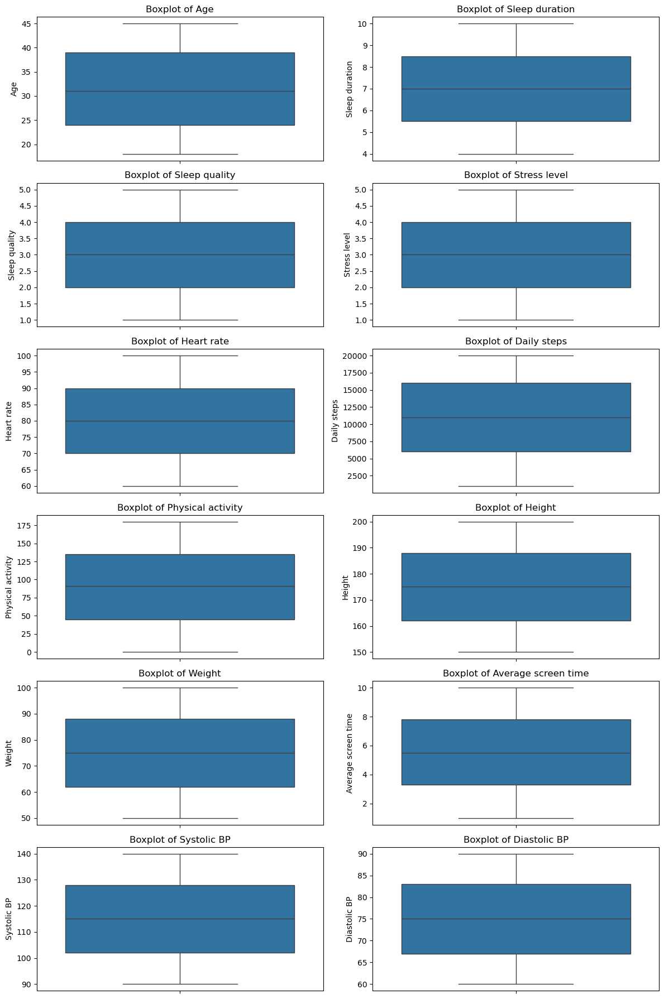

In [154]:
# checking for outliers
numeric=df.select_dtypes(include=np.number).columns
plt.figure(figsize=(12,18))
t=1
for i in numeric:
    plt.subplot(6,2,t)
    sns.boxplot(df[i])
    plt.title(f'Boxplot of {i}')
    t+=1
plt.tight_layout()
plt.show()

<b>
1.No severe outliers in most features.

2.Distributions appear fairly normal or slightly skewed in some cases.
</b>

## Varitant Analysis

### Univaritant analysis

#### Numerical columns

In [ ]:
# numeric columns
numeric=df.select_dtypes(include=np.number).columns

In [ ]:
# Check for skewness 
df[numeric].skew()

Age                    0.012765
Sleep duration         0.001579
Sleep quality          0.001138
Stress level          -0.000976
Heart rate             0.000195
Daily steps           -0.008297
Physical activity     -0.005548
Height                 0.013623
Weight                 0.007795
Average screen time   -0.008789
Systolic BP           -0.002822
Diastolic BP          -0.002684
dtype: float64

In [ ]:
# Check for kurtosis 
df[numeric].kurt()

Age                   -1.202328
Sleep duration        -1.195472
Sleep quality         -1.296320
Stress level          -1.284511
Heart rate            -1.195955
Daily steps           -1.198946
Physical activity     -1.196592
Height                -1.211204
Weight                -1.208840
Average screen time   -1.203389
Systolic BP           -1.201739
Diastolic BP          -1.209035
dtype: float64

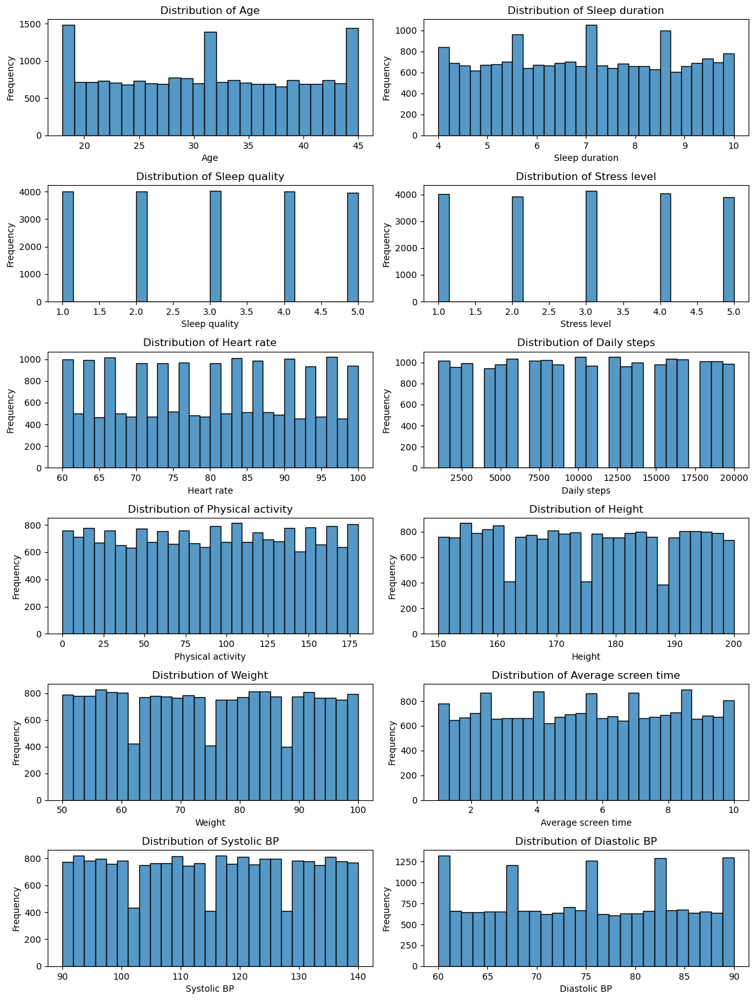

In [ ]:
# plot
plt.figure(figsize=(12,18))
t=1
for i in numeric:
    plt.subplot(7,2,t)
    sns.histplot(df[i])
    plt.title(f'Distribution of {i}')
    plt.xlabel(i)
    plt.ylabel('Frequency')
    t+=1
plt.tight_layout()
plt.show()

<p><b>Age:</b>The age distribution appears roughly uniform between 18 and 45, but there's a notable absence of older adults (above 45 years).</p>
<p><b>Sleep duration:</b>Sleep Duration is slightly right-skewed — many sleep around 6–8 hours, which is ideal, but a subset sleeps <6 hours.</p>
<p><b>Sleep quality:</b>Sleep Quality shows an even spread — indicating variability, and low sleep quality is a known DED risk factor.</p>
<p><b>Stress level:</b>Stress Level:Spread across the full 1–5 scale. Some users report high stress.</p>
<p><b>Average Screen Time:</b>Nearly uniform, with many individuals having >6 hours/day of screen time.High screen exposure reduces blink rate, a direct trigger for Dry Eye Disease — this is likely a strong predictive feature.</p>
<p><b>Heart rate:</b>Uniform, but some individuals are on the higher side (90–100 bpm).</p>

#### categorical columns

In [ ]:
categoric=df.select_dtypes(include='object').columns

In [ ]:
# Value counts of each column
for i in categoric:
    print(df[i].value_counts(normalize=True)*100)

Gender
M    50.14
F    49.86
Name: proportion, dtype: float64
Sleep disorder
N    50.345
Y    49.655
Name: proportion, dtype: float64
Wake up during night
N    50.0
Y    50.0
Name: proportion, dtype: float64
Feel sleepy during day
N    50.89
Y    49.11
Name: proportion, dtype: float64
Caffeine consumption
Y    50.445
N    49.555
Name: proportion, dtype: float64
Alcohol consumption
Y    50.045
N    49.955
Name: proportion, dtype: float64
Smoking
N    50.085
Y    49.915
Name: proportion, dtype: float64
Medical issue
N    50.555
Y    49.445
Name: proportion, dtype: float64
Ongoing medication
Y    50.41
N    49.59
Name: proportion, dtype: float64
Smart device before bed
Y    50.015
N    49.985
Name: proportion, dtype: float64
Blue-light filter
N    50.08
Y    49.92
Name: proportion, dtype: float64
Discomfort Eye-strain
Y    50.185
N    49.815
Name: proportion, dtype: float64
Redness in eye
N    50.645
Y    49.355
Name: proportion, dtype: float64
Itchiness/Irritation in eye
N    50.315
Y   

<b>Almost all the features are fairly distributed.</b>

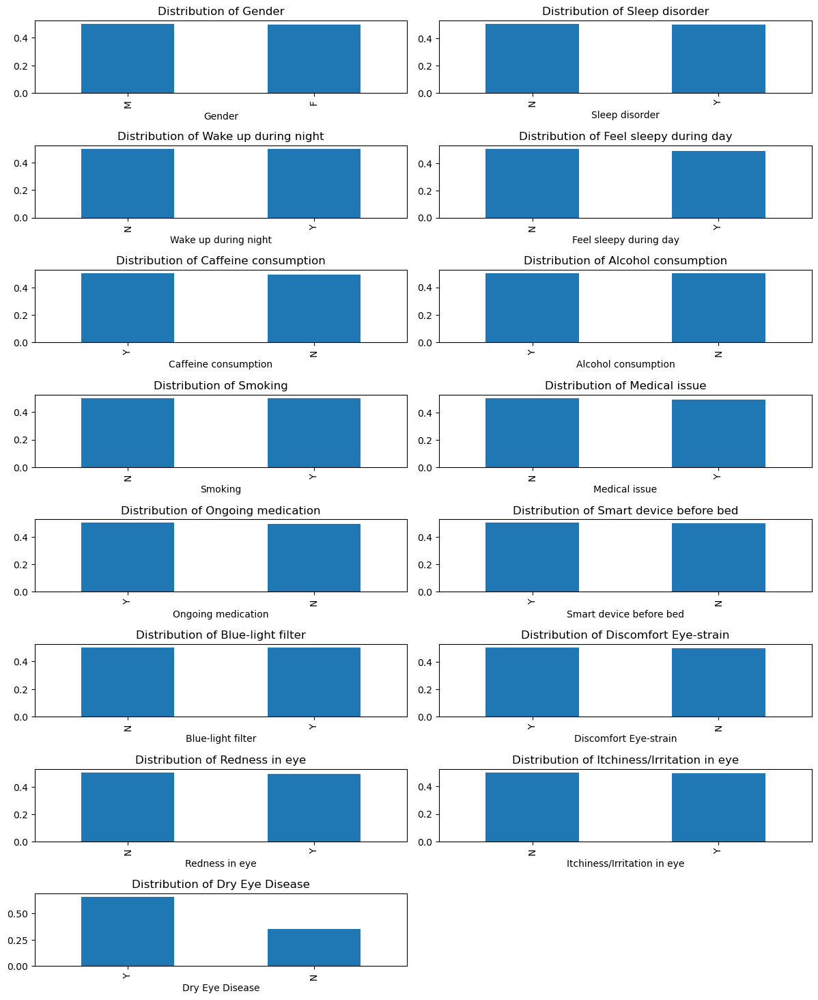

In [ ]:
# Plot
plt.figure(figsize=(12, 18))
t = 1

for i in categoric:
    plt.subplot(10, 2, t)
    df[i].value_counts(normalize=True).plot(kind='bar')
    plt.title(f'Distribution of {i}')
    plt.ylabel('')
    t += 1

plt.tight_layout()
plt.show()


<p><b>Dry Eye Disease:Yes: 65.2%, No: 34.8%</b></br>
Indicates a mild class imbalance — might influence classification metrics like accuracy.</p>

### Bi-variate analysis

In [ ]:
# We use groupby to see the values arrangement with numeric columns and target column. For seeing let's see the mean all values
for i in numeric:
    value = round(df.groupby('Dry Eye Disease')[i].apply(np.mean),2)
    print(f'{i} vs Dry Eye Disease')
    print(value)
    print('\n')

Age vs Dry Eye Disease
Dry Eye Disease
N    31.36
Y    31.45
Name: Age, dtype: float64


Sleep duration vs Dry Eye Disease
Dry Eye Disease
N    7.0
Y    7.0
Name: Sleep duration, dtype: float64


Sleep quality vs Dry Eye Disease
Dry Eye Disease
N    3.01
Y    2.99
Name: Sleep quality, dtype: float64


Stress level vs Dry Eye Disease
Dry Eye Disease
N    2.98
Y    3.00
Name: Stress level, dtype: float64


Heart rate vs Dry Eye Disease
Dry Eye Disease
N    79.95
Y    79.89
Name: Heart rate, dtype: float64


Daily steps vs Dry Eye Disease
Dry Eye Disease
N    10492.32
Y    10560.71
Name: Daily steps, dtype: float64


Physical activity vs Dry Eye Disease
Dry Eye Disease
N    90.31
Y    89.94
Name: Physical activity, dtype: float64


Height vs Dry Eye Disease
Dry Eye Disease
N    175.0
Y    174.8
Name: Height, dtype: float64


Weight vs Dry Eye Disease
Dry Eye Disease
N    74.84
Y    74.92
Name: Weight, dtype: float64


Average screen time vs Dry Eye Disease
Dry Eye Disease
N    5.44
Y    5

<p>
    We observe after grouping are:<br>
    1.Average of <b>Age</b> of people who are diagoised in this data are around 31.<br>
    2.Average of <b>Sleep duration</b> of person is around 7hrs a day<br>
    3.Average of <b>Sleep quality</b> of person who is not having dry eye disease a little higher than a person who is suffering from dry eye disease<br>
    4.Average of <b>Sleep level</b> of person who is having dry eye disease a little higher than a person who is not suffering from dry eye disease<br>
    5.Average <b>Heart rate </b> of a person is almost same for both person having DED and not having DED.<br>
    6. Average <b> Daily steps </b> of person is almost same for people with and without DED.<br>
    7. Average <b> Physical activity</b> of person not having DED is better than person having DED.<br>
    8. Average <b>Height</b> of person who are diagosined in this data is around 175cm.<br>
    9. Average <b>Weight</b> of person who are diagosined in this data is around 75.<br>
    10.Average <b>Screen Time </b> of person having DED is higher than person not having DED. 
</p>

##### checking numeric features relationship with target

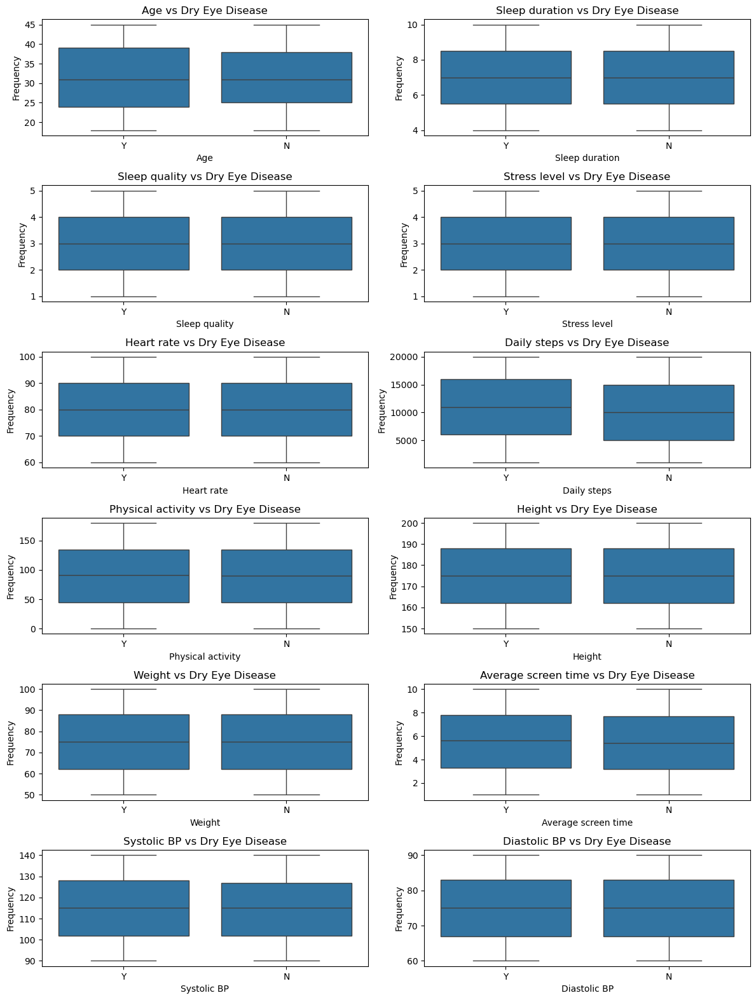

In [ ]:
plt.figure(figsize=(12, 18))
t=1
for i in numeric:
    plt.subplot(7,2,t)
    sns.boxplot(y=df[i], x=df['Dry Eye Disease'])
    plt.title(f'{i} vs Dry Eye Disease')
    plt.xlabel(i)
    plt.ylabel('Frequency')
    t+=1
plt.tight_layout()
plt.show()

<p>

<b>Age:</b>

Slight upward trend in DED frequency with increasing age.Indicates that older individuals are more prone to Dry Eye Disease.

<b>Sleep Duration:</b>

Moderate fluctuations, but overall, DED frequency seems slightly lower with longer sleep durations.Poor sleep may be linked to increased risk of DED.

<b>Heart Rate:</b>

No strong pattern observed, though slightly more DED cases are seen at lower and higher extremes, suggesting possible impact of health/stress levels.

<b>Daily Steps:</b>

Slight downward trend – more physically active individuals (higher steps) seem to have fewer DED cases.Physical activity may help reduce risk.

<b>Physical Activity:</b>

High variability, but generally lower DED frequency at moderate-to-high activity levels.Reinforces that inactivity might correlate with DED.

<b>Height:</b>

No consistent relationship with DED observed.Likely not a significant predictor.

<b>Weight:</b>

Slight upward trend in DED frequency with increasing weight.

<b>Average Screen Time:</b>

Clear upward trend: more screen time strongly correlates with higher DED frequency.Indicates screen exposure is a major risk factor.

<b>Systolic BP:</b>

Moderate rise in DED frequency at higher systolic BP.High BP might be indirectly linked to DED via overall health conditions.

<b>Diastolic BP:</b>

Similar trend to systolic – DED increases with higher diastolic BP.Suggests possible vascular or systemic health impact on eye health.</p>

#### categoric features relationship with target

In [ ]:
# cross tab - create crosstab to see how the values are with all categorical variables with target.
for i in categoric:
    if i!='Dry Eye Disease':
        cross_tab = pd.crosstab(df[i],df['Dry Eye Disease'])
        print(f'{i} vs Dry Eye Disease')
        print(cross_tab)
        print('\n')

Gender vs Dry Eye Disease
Dry Eye Disease     N     Y
Gender                     
F                3394  6578
M                3569  6459


Sleep disorder vs Dry Eye Disease
Dry Eye Disease     N     Y
Sleep disorder             
N                3518  6551
Y                3445  6486


Wake up during night vs Dry Eye Disease
Dry Eye Disease          N     Y
Wake up during night            
N                     3480  6520
Y                     3483  6517


Feel sleepy during day vs Dry Eye Disease
Dry Eye Disease            N     Y
Feel sleepy during day            
N                       3566  6612
Y                       3397  6425


Caffeine consumption vs Dry Eye Disease
Dry Eye Disease          N     Y
Caffeine consumption            
N                     3464  6447
Y                     3499  6590


Alcohol consumption vs Dry Eye Disease
Dry Eye Disease         N     Y
Alcohol consumption            
N                    3532  6459
Y                    3431  6578


Smoking vs 

<p>
    Observation :
</p>

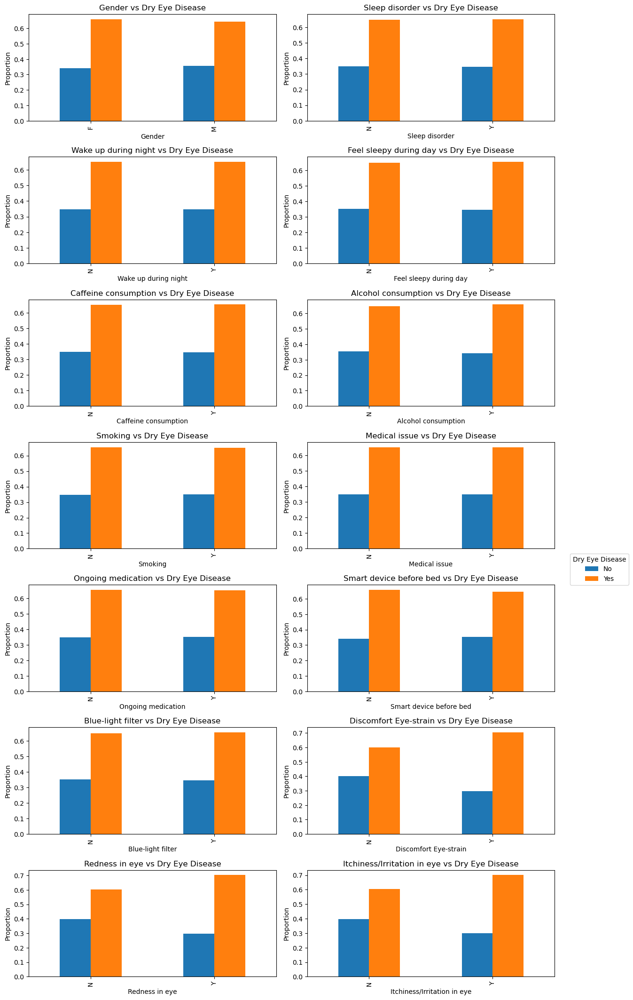

In [ ]:
# Plot
plt.figure(figsize=(12, 24))
t = 1

for col in categoric:
    if col != 'Dry Eye Disease':
        ax = plt.subplot(8, 2, t)
        pd.crosstab(df[col], df['Dry Eye Disease'], normalize='index').plot(
            kind='bar', ax=ax, legend=False)
        ax.set_title(f'{col} vs Dry Eye Disease')
        ax.set_ylabel('Proportion')
        ax.set_xlabel(col)
        t += 1

plt.tight_layout()
plt.legend(['No', 'Yes'], title='Dry Eye Disease', bbox_to_anchor=(1.05, 4), loc='upper left')
plt.show()

<p><b>
Females, individuals with poor sleep quality, high stress, and sleep disorders are more likely to have Dry Eye Disease (DED).

Excessive screen time, especially before bed, and symptoms like eye strain, redness, and irritation are strong indicators of DED.

Use of blue-light filters and maintaining good sleep hygiene may help reduce the risk of DED.

Health factors such as medical issues, ongoing medication, and smoking also show moderate influence on DED presence.</b>
</p>

### Multi varitant Analysis

In [ ]:
# checking the correlation between variables
df[numeric].corr() # tells the strength and direction of relationship of variables.

,Age,Sleep duration,Sleep quality,Stress level,Heart rate,Daily steps,Physical activity,Height,Weight,Average screen time,Systolic BP,Diastolic BP
Age,1.000000,0.004857,0.002513,0.008379,-0.001196,0.001302,-0.009191,-0.005171,0.003908,0.003177,0.018157,-0.016013
Sleep duration,0.004857,1.000000,-0.006892,-0.006088,-0.029175,0.002823,0.001858,0.005259,0.000222,-0.004208,-0.000939,-0.000648
Sleep quality,0.002513,-0.006892,1.000000,0.000721,-0.014326,-0.003074,-0.010329,0.009380,0.005604,0.004697,0.007444,-0.006604
Stress level,0.008379,-0.006088,0.000721,1.000000,-0.008332,-0.005978,0.004272,-0.000651,-0.000611,-0.001344,0.003786,0.004450
Heart rate,-0.001196,-0.029175,-0.014326,-0.008332,1.000000,-0.001899,0.001334,-0.005229,-0.009639,0.002467,-0.005864,0.004728
Daily steps,0.001302,0.002823,-0.003074,-0.005978,-0.001899,1.000000,0.008413,-0.016801,-0.000619,-0.008670,-0.003174,-0.001200
Physical activity,-0.009191,0.001858,-0.010329,0.004272,0.001334,0.008413,1.000000,-0.005989,0.016160,0.006469,-0.003794,0.006379
Height,-0.005171,0.005259,0.009380,-0.000651,-0.005229,-0.016801,-0.005989,1.000000,-0.000974,0.012817,-0.007917,0.001422
Weight,0.003908,0.000222,0.005604,-0.000611,-0.009639,-0.000619,0.016160,-0.000974,1.000000,0.007798,0.003181,-0.003476
Average screen time,0.003177,-0.004208,0.004697,-0.001344,0.002467,-0.008670,0.006469,0.012817,0.007798,1.000000,-0.009392,-0.009701


<p>
        1. <b>Age</b> is have <b>weak postive correlation</b> with columns - <b> Sleep duration,Sleep quality,Stress level,Weight,Average screen time,Daily steps and Systolic BP</b> and <b>weak negative correlation</b> with <b>Heart Rate, Physical Activity DiaStolic BP and Height.</b><br><br>
    2. <b>Sleep duration</b> is have <b>weak postive correlation</b> with columns - <b> Daily steps and Physical activity.</b> and <b>weak negative correlation</b> with <b>Sleep quality, Stress level, Heart rate, Average screen time, Systolic BP, and Diastolic BP.</b><br><br>
    </b>
    3. <b>Sleep quality</b> is have <b>weak postive correlation</b> with columns - <b>Stres level, Systolic BP</b> and <b>weak negative correlation</b> with 
   <b>Sleep duration, Heart rate, Daily steps, and Physical activity.</b><br><br>
    4. <b>Sleep level</b> is have <b>weak postive correlation</b> with columns - <b> Sleep quality, Heart rate, and Diastolic BP.</b> and <b>negative correlation</b> with <b>Sleep duration, Daily steps, Physical activity, Height, and Weight.</b><br><br>
    5. <b>Heart Rate</b> is have <b>weak postive correlation</b> with columns - <b> Stress level and Diastolic BP.</b> and <b>weak negative correlation</b> with <b>Age, Sleep duration, Sleep quality, Daily steps, Physical activity, Height, and Weight.</b><br><br>
    6. <b>Daily Steps</b> is have <b>weak postive correlation</b> with columns - <b>Sleep duration and Physical activity.</b> and <b>negative correlation</b> with <b>Age, Sleep quality, Stress level, Heart rate, Height, Weight, and Average screen time.</b>
    <br><br>
    7. <b>Physical Activity </b> is have <b>weak postive correlation</b> with columns - <b>Sleep duration and Daily steps.</b> and <b>weak negative correlation</b> with <b>Age, Sleep quality, Stress level, Heart rate, Height, and Average screen time.
    </b><br><br>
    8. <b>Height</b> is have <b>weak postive correlation</b> with columns - <b>Average Screen Time</b> and <b>weak negative correlation</b> with <b>
    </b>Age, Sleep duration, Stress level, Heart rate, Daily steps, and Physical activity.<br><br>
    9. <b>Weight</b> is have <b>weak postive correlation</b> with columns - <b>Age and Average screen time. </b> and <b>weak negative correlation</b> with <b>Stress level, Heart rate, Daily steps, and Height.
    </b><br><br>
    10. <b>Average Screen Time</b> is have <b>postive correlation</b> with columns - <b>Age, Height, and Weight.</b> and <b>negative correlation</b> with <b>Sleep duration and Daily steps.
    </b><br><br>
    11. <b>Systolic BP</b> is have <b>weak postive correlation</b> with columns - <b>Sleep Quality</b> and <b>weak negative correlation</b> with <b> Sleep duration, Height, and Average screen time.</b>
    </b><br><br>
    12. <b>Diastolic BP</b> is have <b>weak postive correlation</b> with columns - <b>Stress level and Heart rate.</b> and <b>weak negative correlation</b> with <b>Sleep duration and Average screen time.</b>
    </b>    
</p>

<Axes: >

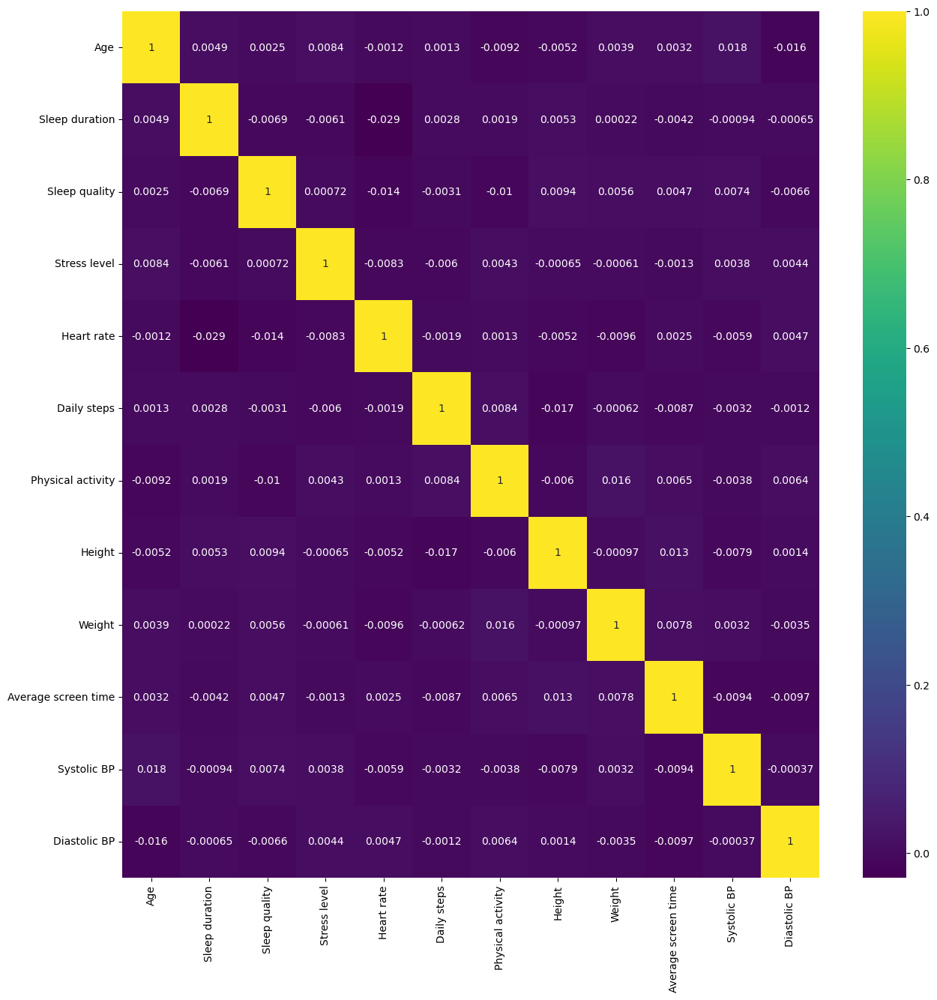

In [ ]:
# plot heatmap
numeric=df.select_dtypes(include=np.number).columns
plt.figure(figsize=(15,15))
sns.heatmap(df[numeric].corr(),annot=True,cmap='viridis')

#### There are no multicolinarity issues in the data 

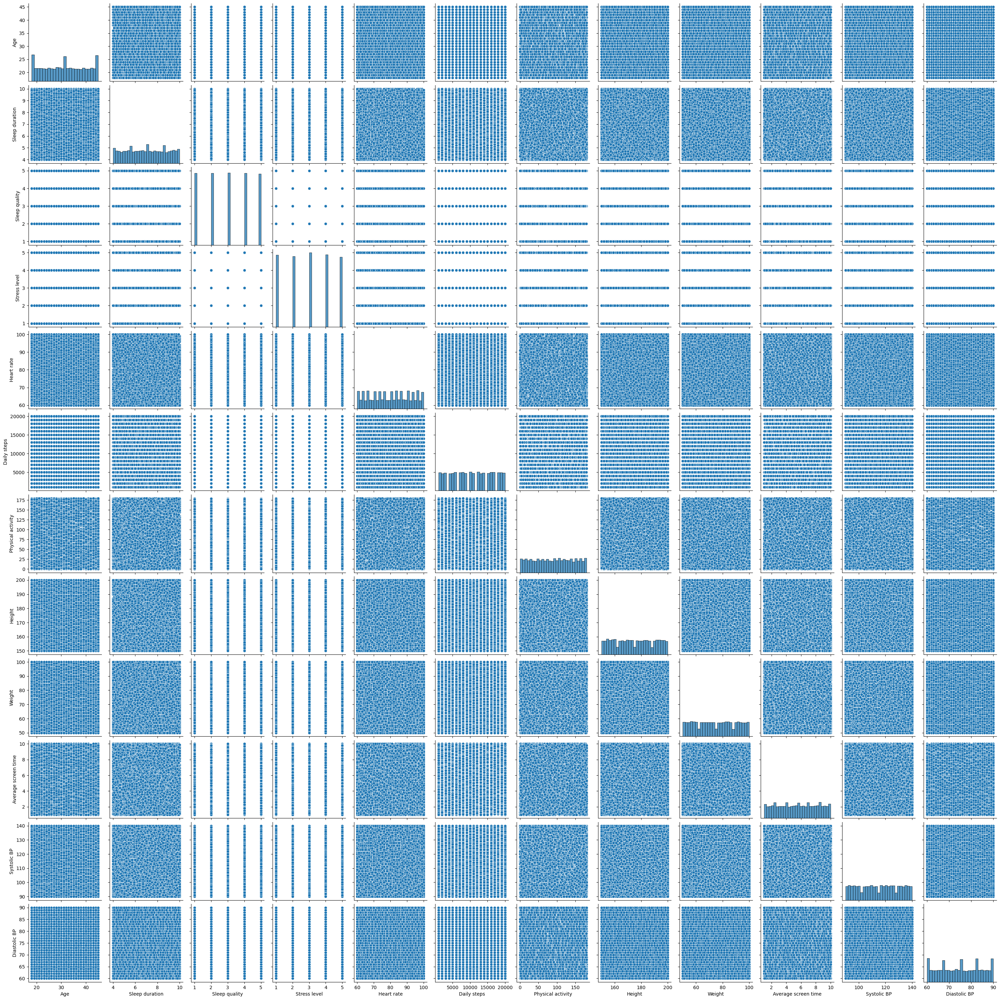

In [ ]:
# Combination of all columns using pairplot
sns.pairplot(df)

## Feature Engineering

In [ ]:
df['Pulse_Pressure']=df['Systolic BP']-df['Diastolic BP']

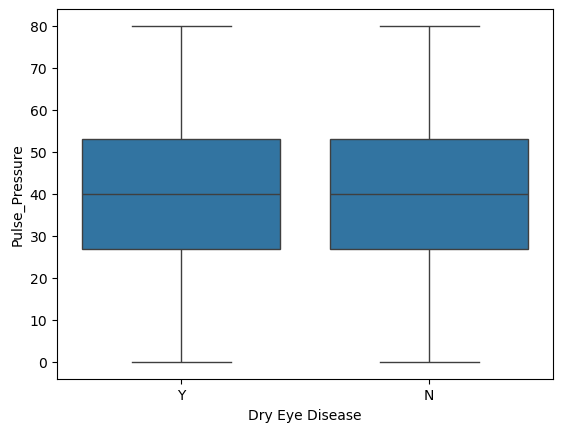

In [ ]:
sns.boxplot(x=df['Dry Eye Disease'],y=df['Pulse_Pressure'])
plt.show()

<b>Pulse Pressure does not show a strong univariate association with Dry Eye Disease.</b>

In [ ]:
# adding one more feature 'BMI'

In [ ]:
df['BMI']=df['Weight'] / (df['Height']/100)**2

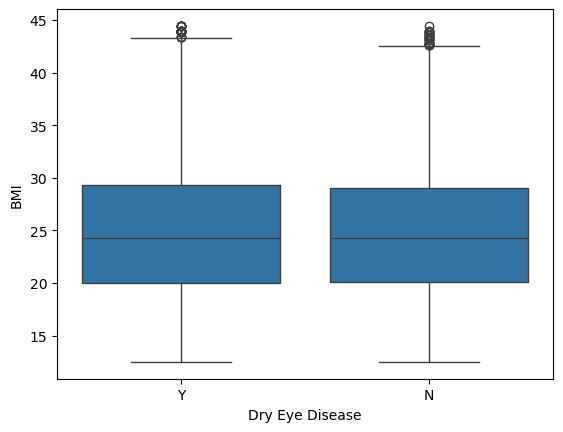

In [ ]:
sns.boxplot(x=df['Dry Eye Disease'],y=df['BMI'])
plt.show()

<p>Median BMI is almost identical for both DED and non-DED groups.</br>
Both groups have similar interquartile ranges (IQR), indicating comparable variability.</br>
There are slightly more high-end outliers in the DED group, but not significantly different.</p>

In [ ]:
#Interaction 
#df['eye_symptom_score'] = df[['Discomfort Eye-strain', 'Redness in eye', 'Itchiness/Irritation in eye']].apply(lambda x: sum(x == 'Y'), axis=1)

In [ ]:
#sns.histplot(df['eye_symptom_score'])

In [ ]:
# Adding Blood pressure category based on systolic and diastolic metrics using data/facts from American Heart Association

In [ ]:
def classify_bp(row):
    systolic = row['Systolic BP']
    diastolic = row['Diastolic BP']
    
    if systolic > 180 or diastolic > 120:
        return 'Hypertensive Crisis'
    elif systolic >= 140 or diastolic >= 90:
        return 'Hypertension Stage 2'
    elif systolic >= 130 or diastolic >= 80:
        return 'Hypertension Stage 1'
    elif systolic >= 120 and diastolic < 80:
        return 'Elevated'
    else:
        return 'Normal'
# Create new column
df['BP_category'] = df.apply(classify_bp, axis=1)

Text(0.5, 1.0, 'BP_category vs Dry eye disease')

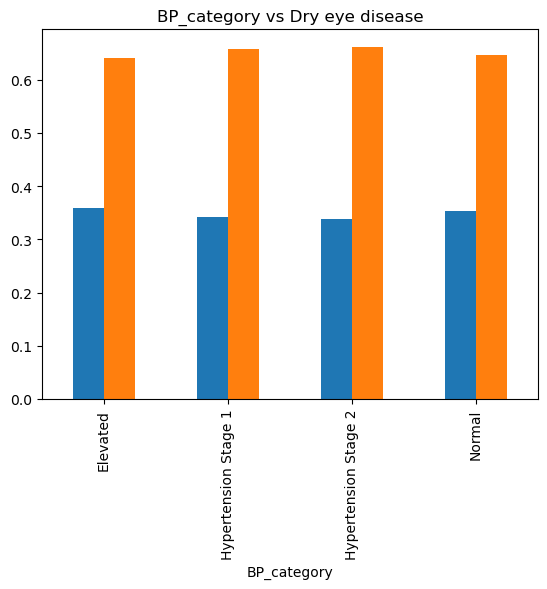

In [ ]:
pd.crosstab(df['BP_category'], df['Dry Eye Disease'], normalize='index').plot(kind='bar',legend=False)
plt.title('BP_category vs Dry eye disease')

<p>The proportion of individuals with Dry Eye Disease (DED) appears to be slightly higher in those categorized under:</br>
<b>Hypertension Stage 1</b></br>
<b>Hypertension Stage 2 </b></p>
<p>Even though the differences are not dramatic, the orange bars (indicating DED = "Yes") 
show a small upward trend from <b>Normal and Elevated BP </b>categories</br> to <b>Stage 1 and Stage 2</b>.</p>

#### Note

<p>We can't categorize age because we don't have significant data in age column</p>

In [ ]:
# Categorizing sleep duration based on data/facts provided by WHO

In [ ]:
def categorize_sleep(duration):
    if duration < 7:
        return 'Short'
    elif 7 <= duration <= 9:
        return 'Healthy'
    else:
        return 'Long'

df['Sleep_category'] = df['Sleep duration'].apply(categorize_sleep)

<Axes: xlabel='Sleep_category'>

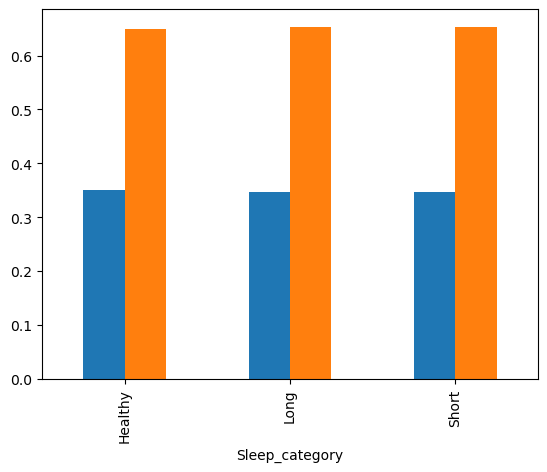

In [ ]:
pd.crosstab(df['Sleep_category'], df['Dry Eye Disease'], normalize='index').plot(kind='bar',legend=False)

<p><b>There is no significant variation in the prevalence of Dry Eye Disease across different sleep duration categories.</b></p>

In [ ]:
#categorizing average screen time using data/facts from National Institute of health

In [ ]:
def categorize_screen_time(hours):
    if hours <= 2:
        return 'Low'
    elif hours <= 6:
        return 'Moderate'
    elif hours <= 9:
        return 'High'
    else:
        return 'Very High'

df['Screen_Time_Category'] = df['Average screen time'].apply(categorize_screen_time)

<Axes: xlabel='Screen_Time_Category'>

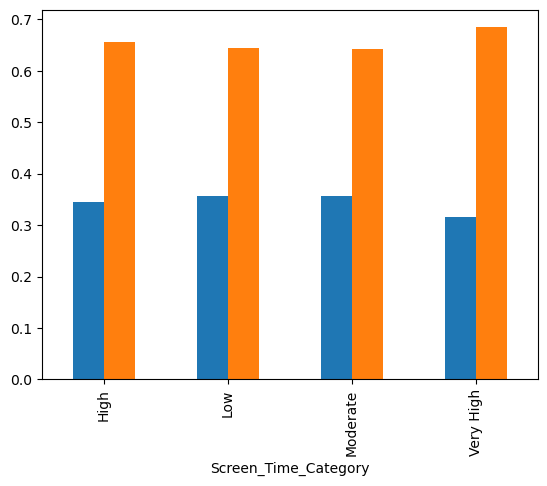

In [ ]:
pd.crosstab(df['Screen_Time_Category'], df['Dry Eye Disease'], normalize='index').plot(kind='bar',legend=False)

<p>The "Very High" screen time category shows the highest proportion of individuals with Dry Eye Disease (DED).</br>
The "Low", "Moderate", and "High" categories all show a relatively lower and consistent proportion of DED cases.</p>
<p><b>This suggests a positive association between very high screen time (≥10 hrs/day) and DED prevalence.</b></p>

In [ ]:
# Using heat map checking corelation after adding new features

<Axes: >

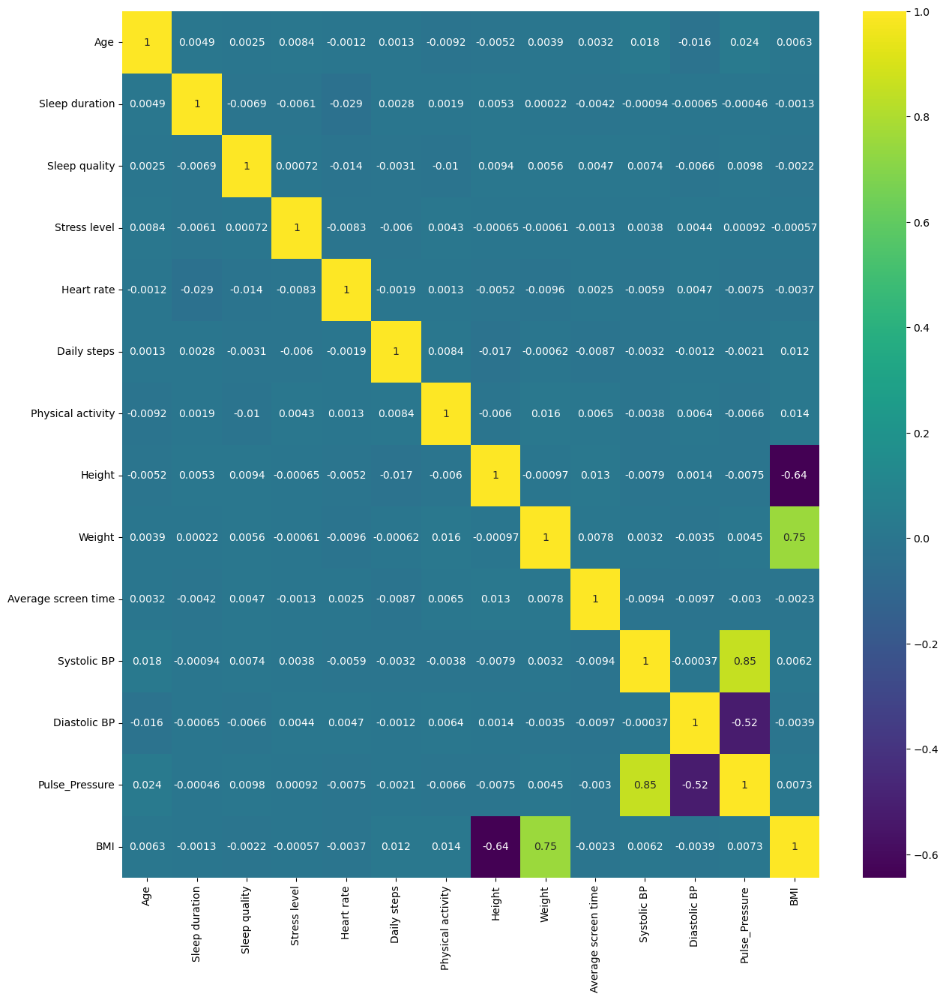

In [ ]:
numeric=df.select_dtypes(include=np.number).columns
plt.figure(figsize=(15,15))
sns.heatmap(df[numeric].corr(),annot=True,cmap='viridis')

<p>
<b>Systolic BP shows a strong positive correlation with Pulse Pressure (0.85), meaning higher systolic pressure is associated with higher pulse pressure.

BMI has a strong positive correlation with Weight (0.75) and a strong negative correlation with Height (-0.64), which is expected given BMI's formula.

Diastolic BP is moderately negatively correlated with Pulse Pressure (-0.52), indicating an inverse relationship.

Most features like age, sleep duration, physical activity, screen time, etc. show very weak or negligible correlations with each other (values close to 0), suggesting they are largely independent in this dataset.</b>
</p>

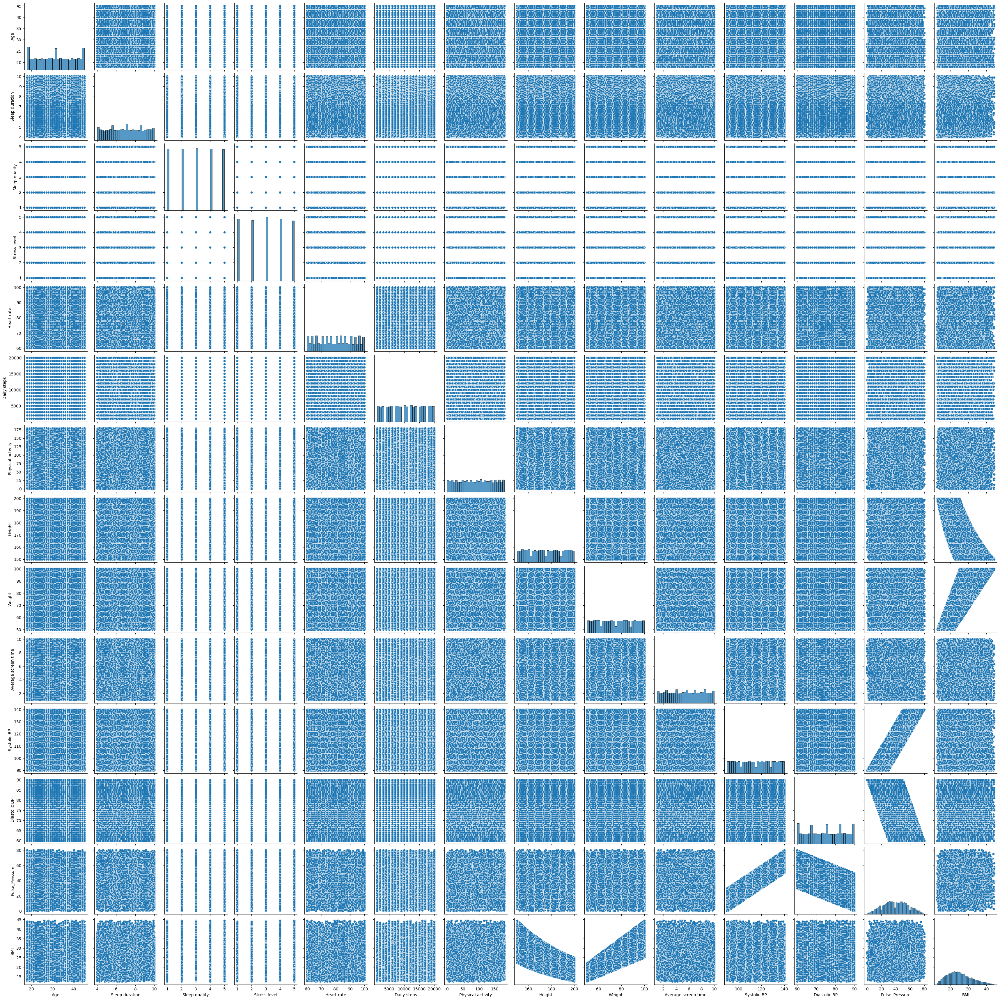

In [ ]:
sns.pairplot(df)
plt.show()

In [ ]:
df.head()

,Gender,Age,Sleep duration,Sleep quality,Stress level,Heart rate,Daily steps,Physical activity,Height,Weight,Sleep disorder,Wake up during night,Feel sleepy during day,Caffeine consumption,Alcohol consumption,Smoking,Medical issue,Ongoing medication,Smart device before bed,Average screen time,Blue-light filter,Discomfort Eye-strain,Redness in eye,Itchiness/Irritation in eye,Dry Eye Disease,Systolic BP,Diastolic BP,Pulse_Pressure,BMI,BP_category,Sleep_category,Screen_Time_Category
0,F,24,9.5,2,1,67,3000,31,161,69,Y,N,N,N,N,N,Y,Y,N,8.7,N,Y,Y,N,Y,137,89,48,26.619343,Hypertension Stage 1,Long,High
1,M,39,9.6,2,3,60,12000,74,164,87,N,N,N,N,Y,N,Y,Y,N,9.6,Y,N,N,Y,Y,108,64,44,32.346817,Normal,Long,Very High
2,F,45,5.4,1,5,95,12000,93,179,94,Y,Y,N,Y,Y,N,N,N,Y,4.0,N,Y,N,N,N,134,81,53,29.337411,Hypertension Stage 1,Short,Moderate
3,F,45,5.4,4,5,78,19000,32,160,77,N,N,N,Y,N,N,Y,N,N,7.6,N,Y,N,Y,N,110,90,20,30.078125,Hypertension Stage 2,Short,High
4,F,42,5.7,3,2,72,4000,173,179,99,N,Y,N,N,N,N,Y,N,N,3.5,N,Y,Y,N,Y,99,67,32,30.897912,Normal,Short,Moderate


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Gender                       20000 non-null  object 
 1   Age                          20000 non-null  int64  
 2   Sleep duration               20000 non-null  float64
 3   Sleep quality                20000 non-null  int64  
 4   Stress level                 20000 non-null  int64  
 5   Heart rate                   20000 non-null  int64  
 6   Daily steps                  20000 non-null  int64  
 7   Physical activity            20000 non-null  int64  
 8   Height                       20000 non-null  int64  
 9   Weight                       20000 non-null  int64  
 10  Sleep disorder               20000 non-null  object 
 11  Wake up during night         20000 non-null  object 
 12  Feel sleepy during day       20000 non-null  object 
 13  Caffeine consump

## Statistical Analysis

### Checking the Relationship Between Categorical Features and Target (Dry Eye Disease)

In [ ]:
categoric=df.select_dtypes(include='object').columns

In [ ]:
from scipy.stats import chi2_contingency

for col in categoric:
    if col !='Dry Eye Disease':
        contingency_table = pd.crosstab(df[col], df['Dry Eye Disease'])
        chi2, p, dof, expected = chi2_contingency(contingency_table)
        print(f"Chi-squared test for {col}:")
        print(f"  p-value: {p}")
        if p < 0.05:
            print("  Conclusion: There is a statistically significant association between", col, "and Dry Eye Disease.")
        else:
            print("  Conclusion: There is no statistically significant association between", col, "and Dry Eye Disease.")

Chi-squared test for Gender:
  p-value: 0.021828490579784587
  Conclusion: There is a statistically significant association between Gender and Dry Eye Disease.
Chi-squared test for Sleep disorder:
  p-value: 0.7221535325778164
  Conclusion: There is no statistically significant association between Sleep disorder and Dry Eye Disease.
Chi-squared test for Wake up during night:
  p-value: 0.976317135025137
  Conclusion: There is no statistically significant association between Wake up during night and Dry Eye Disease.
Chi-squared test for Feel sleepy during day:
  p-value: 0.5130635624335508
  Conclusion: There is no statistically significant association between Feel sleepy during day and Dry Eye Disease.
Chi-squared test for Caffeine consumption:
  p-value: 0.6998640860594175
  Conclusion: There is no statistically significant association between Caffeine consumption and Dry Eye Disease.
Chi-squared test for Alcohol consumption:
  p-value: 0.11471729580950671
  Conclusion: There is no st

### Checking relationship between numeric columns and Target(DED)

In [ ]:
from scipy.stats import ttest_ind
numeric=df.select_dtypes(include=np.number).columns
for i in numeric:
    group1=df[df['Dry Eye Disease']=='Y'][i]
    group2=df[df['Dry Eye Disease']=='N'][i]
    t_stat, p_val = ttest_ind(group1, group2, equal_var=False)
    print(f"ttest_ind for {i}:")
    print(f"  p-value: {p_val}")
    if p_val < 0.05:
        
        print("  Conclusion: There is a statistically significant association between", i, "and Dry Eye Disease.")
    else:
        print("  Conclusion: There is no statistically significant association between", i, "and Dry Eye Disease.")

ttest_ind for Age:
  p-value: 0.4551966961334818
  Conclusion: There is no statistically significant association between Age and Dry Eye Disease.
ttest_ind for Sleep duration:
  p-value: 0.9017517338200809
  Conclusion: There is no statistically significant association between Sleep duration and Dry Eye Disease.
ttest_ind for Sleep quality:
  p-value: 0.48058640504727035
  Conclusion: There is no statistically significant association between Sleep quality and Dry Eye Disease.
ttest_ind for Stress level:
  p-value: 0.43780627515387893
  Conclusion: There is no statistically significant association between Stress level and Dry Eye Disease.
ttest_ind for Heart rate:
  p-value: 0.7686684301333943
  Conclusion: There is no statistically significant association between Heart rate and Dry Eye Disease.
ttest_ind for Daily steps:
  p-value: 0.42294616126017226
  Conclusion: There is no statistically significant association between Daily steps and Dry Eye Disease.
ttest_ind for Physical activity

#### Checking relationship of 'Discomfort Eye-strain' with others

In [ ]:
categoric=df.select_dtypes(include='object').columns
for col in categoric:
    if col !='Discomfort Eye-strain':
        contingency_table = pd.crosstab(df[col], df['Discomfort Eye-strain'])
        chi2, p, dof, expected = chi2_contingency(contingency_table)
        print(f"Chi-squared test for {col}:")
        print(f"  p-value: {p}")
        if p < 0.05:
            print("  Conclusion: There is a statistically significant association between", col, "and Discomfort_Eye_strain.")
        else:
            print("  Conclusion: There is no statistically significant association between", col, "and Discomfort_Eye_strain.")

Chi-squared test for Gender:
  p-value: 0.15686513706263844
  Conclusion: There is no statistically significant association between Gender and Discomfort_Eye_strain.
Chi-squared test for Sleep disorder:
  p-value: 0.05224098750401518
  Conclusion: There is no statistically significant association between Sleep disorder and Discomfort_Eye_strain.
Chi-squared test for Wake up during night:
  p-value: 0.0389451525446194
  Conclusion: There is a statistically significant association between Wake up during night and Discomfort_Eye_strain.
Chi-squared test for Feel sleepy during day:
  p-value: 0.18060451667099042
  Conclusion: There is no statistically significant association between Feel sleepy during day and Discomfort_Eye_strain.
Chi-squared test for Caffeine consumption:
  p-value: 0.40667022683071474
  Conclusion: There is no statistically significant association between Caffeine consumption and Discomfort_Eye_strain.
Chi-squared test for Alcohol consumption:
  p-value: 0.4363956911859

In [ ]:
numeric=df.select_dtypes(include=np.number).columns
for i in numeric:
    group1=df[df['Discomfort Eye-strain']=='Y'][i]
    group2=df[df['Discomfort Eye-strain']=='N'][i]
    t_stat, p_val = ttest_ind(group1, group2, equal_var=False)
    print(f"ttest_ind for {i}:")
    print(f"  p-value: {p_val}")
    if p_val < 0.05:
        print("  Conclusion: There is a statistically significant association between", i, "and Discomfort_Eye_strain.")
    else:
        print("  Conclusion: There is no statistically significant association between", i, "and Discomfort_Eye_strain.")

ttest_ind for Age:
  p-value: 0.8798165544035563
  Conclusion: There is no statistically significant association between Age and Discomfort_Eye_strain.
ttest_ind for Sleep duration:
  p-value: 0.3547867905298251
  Conclusion: There is no statistically significant association between Sleep duration and Discomfort_Eye_strain.
ttest_ind for Sleep quality:
  p-value: 0.8365610933041095
  Conclusion: There is no statistically significant association between Sleep quality and Discomfort_Eye_strain.
ttest_ind for Stress level:
  p-value: 0.5823154997553185
  Conclusion: There is no statistically significant association between Stress level and Discomfort_Eye_strain.
ttest_ind for Heart rate:
  p-value: 0.006522746061377654
  Conclusion: There is a statistically significant association between Heart rate and Discomfort_Eye_strain.
ttest_ind for Daily steps:
  p-value: 0.9879673468121671
  Conclusion: There is no statistically significant association between Daily steps and Discomfort_Eye_strai

#### Checking relation between Redness_in_eye with other features

In [ ]:
for col in categoric:
    if col !='Redness in eye':
        contingency_table = pd.crosstab(df[col], df['Redness in eye'])
        chi2, p, dof, expected = chi2_contingency(contingency_table)
        print(f"Chi-squared test for {col}:")
        print(f"  p-value: {p}")
        if p < 0.05:
            print("  Conclusion: There is a statistically significant association between", col, "and Redness_in_eye.")
        else:
            print("  Conclusion: There is no statistically significant association between", col, "and Redness_in_eye.")

Chi-squared test for Gender:
  p-value: 0.30610407349932006
  Conclusion: There is no statistically significant association between Gender and Redness_in_eye.
Chi-squared test for Sleep disorder:
  p-value: 0.822178433407876
  Conclusion: There is no statistically significant association between Sleep disorder and Redness_in_eye.
Chi-squared test for Wake up during night:
  p-value: 0.5715756393673286
  Conclusion: There is no statistically significant association between Wake up during night and Redness_in_eye.
Chi-squared test for Feel sleepy during day:
  p-value: 0.3104444205228418
  Conclusion: There is no statistically significant association between Feel sleepy during day and Redness_in_eye.
Chi-squared test for Caffeine consumption:
  p-value: 0.9307049417149937
  Conclusion: There is no statistically significant association between Caffeine consumption and Redness_in_eye.
Chi-squared test for Alcohol consumption:
  p-value: 0.7677130484842005
  Conclusion: There is no statisti

In [ ]:
for i in numeric:
    group1=df[df['Redness in eye']=='Y'][i]
    group2=df[df['Redness in eye']=='N'][i]
    t_stat, p_val = ttest_ind(group1, group2, equal_var=False)
    print(f"ttest_ind for {i}:")
    print(f"  p-value: {p_val}")
    if p_val < 0.05:
        print("  Conclusion: There is a statistically significant association between", i, "and Redness_in_eye.")
    else:
        print("  Conclusion: There is no statistically significant association between", i, "and Redness_in_eye.")

ttest_ind for Age:
  p-value: 0.14388904952763704
  Conclusion: There is no statistically significant association between Age and Redness_in_eye.
ttest_ind for Sleep duration:
  p-value: 0.5416949597060445
  Conclusion: There is no statistically significant association between Sleep duration and Redness_in_eye.
ttest_ind for Sleep quality:
  p-value: 0.6876887964293896
  Conclusion: There is no statistically significant association between Sleep quality and Redness_in_eye.
ttest_ind for Stress level:
  p-value: 0.08997575297866588
  Conclusion: There is no statistically significant association between Stress level and Redness_in_eye.
ttest_ind for Heart rate:
  p-value: 0.5402524009124072
  Conclusion: There is no statistically significant association between Heart rate and Redness_in_eye.
ttest_ind for Daily steps:
  p-value: 0.9172460074626028
  Conclusion: There is no statistically significant association between Daily steps and Redness_in_eye.
ttest_ind for Physical activity:
  p-v

#### Checking Itchiness_Irritation_in_eye relation with other features

In [ ]:
for col in categoric:
    if col !='Itchiness/Irritation in eye':
        contingency_table = pd.crosstab(df[col], df['Itchiness/Irritation in eye'])
        chi2, p, dof, expected = chi2_contingency(contingency_table)
        print(f"Chi-squared test for {col}:")
        print(f"  p-value: {p}")
        if p < 0.05:
            print("  Conclusion: There is a statistically significant association between", col, "and Itchiness_Irritation_in_eye.")
        else:
            print("  Conclusion: There is no statistically significant association between", col, "and Itchiness_Irritation_in_eye.")

Chi-squared test for Gender:
  p-value: 0.9794246694000222
  Conclusion: There is no statistically significant association between Gender and Itchiness_Irritation_in_eye.
Chi-squared test for Sleep disorder:
  p-value: 0.3402292909659239
  Conclusion: There is no statistically significant association between Sleep disorder and Itchiness_Irritation_in_eye.
Chi-squared test for Wake up during night:
  p-value: 0.5716000120355238
  Conclusion: There is no statistically significant association between Wake up during night and Itchiness_Irritation_in_eye.
Chi-squared test for Feel sleepy during day:
  p-value: 0.4030131843010545
  Conclusion: There is no statistically significant association between Feel sleepy during day and Itchiness_Irritation_in_eye.
Chi-squared test for Caffeine consumption:
  p-value: 0.8603499367099143
  Conclusion: There is no statistically significant association between Caffeine consumption and Itchiness_Irritation_in_eye.
Chi-squared test for Alcohol consumption:

In [ ]:
for i in numeric:
    group1=df[df['Itchiness/Irritation in eye']=='Y'][i]
    group2=df[df['Itchiness/Irritation in eye']=='N'][i]
    t_stat, p_val = ttest_ind(group1, group2, equal_var=False)
    print(f"ttest_ind for {i}:")
    print(f"  p-value: {p_val}")
    if p_val < 0.05:
        print("  Conclusion: There is a statistically significant association between", i, "and Itchiness/Irritation in eye.")
    else:
        print("  Conclusion: There is no statistically significant association between", i, "and Itchiness/Irritation in eye.")

ttest_ind for Age:
  p-value: 0.16183978477322059
  Conclusion: There is no statistically significant association between Age and Itchiness/Irritation in eye.
ttest_ind for Sleep duration:
  p-value: 0.31058473069037523
  Conclusion: There is no statistically significant association between Sleep duration and Itchiness/Irritation in eye.
ttest_ind for Sleep quality:
  p-value: 0.7134420768998713
  Conclusion: There is no statistically significant association between Sleep quality and Itchiness/Irritation in eye.
ttest_ind for Stress level:
  p-value: 0.5606938706675242
  Conclusion: There is no statistically significant association between Stress level and Itchiness/Irritation in eye.
ttest_ind for Heart rate:
  p-value: 0.9794282775213409
  Conclusion: There is no statistically significant association between Heart rate and Itchiness/Irritation in eye.
ttest_ind for Daily steps:
  p-value: 0.2538358865200496
  Conclusion: There is no statistically significant association between Daily

## Additional Featuring

### Removing spaces and special characters from column names

In [ ]:
df.columns = df.columns.str.strip()  # remove leading/trailing spaces
df.columns = df.columns.str.replace('[^0-9a-zA-Z]+', '_', regex=True)

In [ ]:
df.columns

Index(['Gender', 'Age', 'Sleep_duration', 'Sleep_quality', 'Stress_level',
       'Heart_rate', 'Daily_steps', 'Physical_activity', 'Height', 'Weight',
       'Sleep_disorder', 'Wake_up_during_night', 'Feel_sleepy_during_day',
       'Caffeine_consumption', 'Alcohol_consumption', 'Smoking',
       'Medical_issue', 'Ongoing_medication', 'Smart_device_before_bed',
       'Average_screen_time', 'Blue_light_filter', 'Discomfort_Eye_strain',
       'Redness_in_eye', 'Itchiness_Irritation_in_eye', 'Dry_Eye_Disease',
       'Systolic_BP', 'Diastolic_BP', 'Pulse_Pressure', 'BMI', 'BP_category',
       'Sleep_category', 'Screen_Time_Category'],
      dtype='object')

In [ ]:
categoric=df.select_dtypes(include='object').columns
categoric

Index(['Gender', 'Sleep_disorder', 'Wake_up_during_night',
       'Feel_sleepy_during_day', 'Caffeine_consumption', 'Alcohol_consumption',
       'Smoking', 'Medical_issue', 'Ongoing_medication',
       'Smart_device_before_bed', 'Blue_light_filter', 'Discomfort_Eye_strain',
       'Redness_in_eye', 'Itchiness_Irritation_in_eye', 'Dry_Eye_Disease',
       'BP_category', 'Sleep_category', 'Screen_Time_Category'],
      dtype='object')

## Preprocessing for Model

#### Encoding the categoric features

In [ ]:
#df=df.drop('symptom_severity',axis=1)

In [ ]:
df1=df.copy()

In [ ]:
df1 = pd.get_dummies(df, columns=['Gender', 'Sleep_disorder', 'Wake_up_during_night','Feel_sleepy_during_day', 'Caffeine_consumption',
                                  'Alcohol_consumption','Smoking', 'Medical_issue', 'Ongoing_medication','Smart_device_before_bed', 'Blue_light_filter', 
                                  'Discomfort_Eye_strain','Redness_in_eye', 'Itchiness_Irritation_in_eye','BP_category', 'Sleep_category', 'Screen_Time_Category']
                                   , drop_first=True,dtype=int)

In [ ]:
le = LabelEncoder()
df1['Dry_Eye_Disease'] = le.fit_transform(df['Dry_Eye_Disease'])

<IPython.core.display.Javascript object>

In [ ]:
df1.head(5)

,Age,Sleep_duration,Sleep_quality,Stress_level,Heart_rate,Daily_steps,Physical_activity,Height,Weight,Average_screen_time,Dry_Eye_Disease,Systolic_BP,Diastolic_BP,Pulse_Pressure,BMI,Gender_M,Sleep_disorder_Y,Wake_up_during_night_Y,Feel_sleepy_during_day_Y,Caffeine_consumption_Y,Alcohol_consumption_Y,Smoking_Y,Medical_issue_Y,Ongoing_medication_Y,Smart_device_before_bed_Y,Blue_light_filter_Y,Discomfort_Eye_strain_Y,Redness_in_eye_Y,Itchiness_Irritation_in_eye_Y,BP_category_Hypertension Stage 1,BP_category_Hypertension Stage 2,BP_category_Normal,Sleep_category_Long,Sleep_category_Short,Screen_Time_Category_Low,Screen_Time_Category_Moderate,Screen_Time_Category_Very High
0,24,9.5,2,1,67,3000,31,161,69,8.7,1,137,89,48,26.619343,0,1,0,0,0,0,0,1,1,0,0,1,1,0,1,0,0,1,0,0,0,0
1,39,9.6,2,3,60,12000,74,164,87,9.6,1,108,64,44,32.346817,1,0,0,0,0,1,0,1,1,0,1,0,0,1,0,0,1,1,0,0,0,1
2,45,5.4,1,5,95,12000,93,179,94,4.0,0,134,81,53,29.337411,0,1,1,0,1,1,0,0,0,1,0,1,0,0,1,0,0,0,1,0,1,0
3,45,5.4,4,5,78,19000,32,160,77,7.6,0,110,90,20,30.078125,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,1,0,0,1,0,0,0
4,42,5.7,3,2,72,4000,173,179,99,3.5,1,99,67,32,30.897912,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,1,0,1,0


#### Transformation is not done since all columns are skewed.

In [ ]:
numcol=['Age', 'Sleep_duration', 'Sleep_quality', 'Stress_level', 'Heart_rate','Daily_steps', 'Physical_activity',
        'Average_screen_time', 'Systolic_BP', 'Diastolic_BP', 'Pulse_Pressure','BMI']

In [ ]:
# Scaling
ss=StandardScaler()
df1[numcol]=ss.fit_transform(df1[numcol])

<IPython.core.display.Javascript object>

In [ ]:
# Save it in excel
#df1.to_csv('encoded_dry_eye.csv', index=False)

#### Train Test Split

In [ ]:
X=df1.drop(['Dry_Eye_Disease','Height','Weight'],axis=1)
y=df1['Dry_Eye_Disease']

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=42,stratify=y)

<IPython.core.display.Javascript object>

In [ ]:
print('Xtrain',X_train.shape)
print('Xtest',X_test.shape)
print('ytrain',y_train.shape)
print('ytest',y_test.shape)

Xtrain (14000, 34)
Xtest (6000, 34)
ytrain (14000,)
ytest (6000,)


In [ ]:
print('y_train')
y_train.value_counts()

y_train


Dry_Eye_Disease
1    9126
0    4874
Name: count, dtype: int64

In [ ]:
print('y_test')
y_test.value_counts()

y_test


Dry_Eye_Disease
1    3911
0    2089
Name: count, dtype: int64

#### Defining functions used forn metrics and evaluation of model

In [ ]:
def metrics(y_test,y_pred,model):
    print(model)
    print('accuracy',accuracy_score(y_test,y_pred))
    print('precision',precision_score(y_test,y_pred))
    print('recall',recall_score(y_test,y_pred))
    print('fi score',f1_score(y_test,y_pred))
    print('classification report',classification_report(y_test,y_pred))

In [ ]:
def plot_roc_curve(y_true, y_probs, model):
    fpr, tpr, thresholds = roc_curve(y_true, y_probs)

    # Calculate AUC Score
    auc_score = roc_auc_score(y_true, y_probs)
    print(f'ROC-AUC Score for {model}: {auc_score:.2f}')

    # Plot
    plt.figure(figsize=(8,6))
    plt.plot(fpr, tpr, color='blue', label=f'{model} (AUC = {auc_score:.2f})')
    plt.plot([0, 1], [0, 1], color='red', linestyle='--') 
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {model}')
    plt.legend()
    plt.grid()
    plt.show()

In [ ]:
def plot_confusion_matrix(y_test, y_pred):

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
def vif_check(X,numcol):
    vif=pd.DataFrame()
    vif['feature']=X[numcol].columns
    vif['vifscore']=[variance_inflation_factor(X[numcol].values,i) for i in range(X[numcol].shape[1])]
    vif['vifscore']=round(vif['vifscore'],2)
    vif=vif.sort_values(by='vifscore',ascending=False)
    return vif

In [ ]:
def imp_feature(model):
    importance = model.feature_importances_
    features = X_train.columns
    
    feat_df = pd.DataFrame({'Feature': features, 'Importance': importance})
    feat_df = feat_df.sort_values(by='Importance', ascending=False)
    
    plt.figure(figsize=(10,6))
    plt.barh(feat_df['Feature'], feat_df['Importance'])
    plt.xlabel("Importance Score")
    plt.ylabel("Features")
    plt.title("Feature Importance")
    plt.gca().invert_yaxis()
    plt.show()

In [ ]:
# train dataframe
train_model = pd.DataFrame(columns = ['Model Name','Accuracy Score','Precision Score','Recall Score','F1 Score'])
def train_df(s,test,pred):
    global train_model
    new_model = pd.DataFrame({'Model Name':[s]
                              ,'Accuracy Score':[accuracy_score(test,pred)*100],
                              'Precision Score':[precision_score(test,pred)*100],
                              'Recall Score':[recall_score(test,pred)*100],
                              'F1 Score':[f1_score(test,pred)*100]})
    train_model = pd.concat([train_model,new_model],axis = 0)
    return train_model

In [ ]:
# test dataframe
test_model = pd.DataFrame(columns = ['Model Name','Accuracy Score','Precision Score','Recall Score','F1 Score'])
def test_df(s,test,pred):
    global test_model
    new_model = pd.DataFrame({'Model Name':[s]
                              ,'Accuracy Score':[accuracy_score(test,pred)*100],
                              'Precision Score':[precision_score(test,pred)*100],
                              'Recall Score':[recall_score(test,pred)*100],
                              'F1 Score':[f1_score(test,pred)*100]})
    test_model = pd.concat([test_model,new_model],axis = 0)
    return test_model

In [ ]:
# Model Summary 
model_summary = pd.DataFrame(columns = ['Model Name','Accuracy Score','Precision Score','Recall Score','F1 Score'])
def model_df(s,test,pred):
    global model_summary
    new_model = pd.DataFrame({'Model Name':[s]
                              ,'Accuracy Score':[accuracy_score(test,pred)*100],
                              'Precision Score':[precision_score(test,pred)*100],
                              'Recall Score':[recall_score(test,pred)*100],
                              'F1 Score':[f1_score(test,pred)*100]})
    model_summary = pd.concat([model_summary,new_model],axis = 0)
    return model_summary

## Model building

### 1.Logistic Regression

#### Assumptions of Logistic Regression is:
<p>
    1.<b>Assumption 1 </b>: Independence of error, whereby all sample group outcomes areseparate from each other (i.e., there are no duplicate responses)<br>
    2.<b>Assumption 2 </b>: Linearity in the logit for any continuous independent variables<br>
    3.<b>Assumption 3 </b>: Absence of multicollinearity<br>
    4.<b>Assumption 4</b>: Lack of strongly influential outliers<br>
</p>

In [ ]:
# Create a intial model
lr=LogisticRegression()
lr_model=lr.fit(X_train,y_train)


<IPython.core.display.Javascript object>

In [ ]:
y_train_pred = lr_model.predict(X_train)
y_test_pred = lr_model.predict(X_test)

In [ ]:
train_df("Logistic Regression Base model",y_train,y_train_pred)

,Model Name,Accuracy Score,Precision Score,Recall Score,F1 Score
0,Logistic Regression Base model,68.335714,68.15193,96.537366,79.898427


In [ ]:
test_df("Logistic Regression Base model",y_test,y_test_pred)

,Model Name,Accuracy Score,Precision Score,Recall Score,F1 Score
0,Logistic Regression Base model,67.7,67.790803,96.113526,79.505076


<p><b>The model well performing well on both train and test data</b> But there looks like <b>little overfitting issue </b> in model</p> 

In [ ]:
# from sklearn.metrics import precision_recall_curve, average_precision_score

In [ ]:
# Model 
lr=LogisticRegression()
lr_model=lr.fit(X_train,y_train)
y_pred=lr_model.predict(X_test)
#y_pred_proba=lr_model.predict_proba(X_test)[:,1]
#y_pred = [0  if x<0.5  else 1  for x in y_pred_proba] # considering 0.5 as thresold value

<IPython.core.display.Javascript object>

<p> Observation: Accuracy is moderate and Recall is higher than precision</p>

#### Metrics

In [ ]:
metrics(y_test,y_pred,'Logistic Regression')

Logistic Regression
accuracy 0.677
precision 0.6779080252479711
recall 0.9611352595244184
fi score 0.7950507614213198
classification report               precision    recall  f1-score   support

           0       0.67      0.15      0.24      2089
           1       0.68      0.96      0.80      3911

    accuracy                           0.68      6000
   macro avg       0.67      0.55      0.52      6000
weighted avg       0.67      0.68      0.60      6000



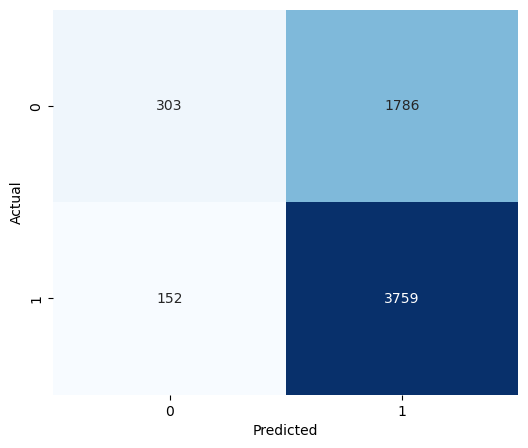

In [ ]:
plot_confusion_matrix(y_test,y_pred)

<p>The <b>model</b> looks to perform well and <b> predicts all values perfectly</b>.</p>

<p>Here the accuracy from model is 68%. The model predicts values perfectly as positives since recall value is higher compared to precision value for a person who is suffering from DED.</p>

#### Issues in model

In [ ]:
# check for the multicolinearity issue.
vif_check(X_train,numcol)

,feature,vifscore
8,Systolic_BP,inf
9,Diastolic_BP,inf
10,Pulse_Pressure,inf
0,Age,1.0
1,Sleep_duration,1.0
2,Sleep_quality,1.0
3,Stress_level,1.0
4,Heart_rate,1.0
5,Daily_steps,1.0
6,Physical_activity,1.0


In [ ]:
X=df1.drop(['Dry_Eye_Disease','Diastolic_BP'],axis=1)
y=df1['Dry_Eye_Disease']
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=42,stratify=y)
print('Xtrain',X_train.shape)
print('Xtest',X_test.shape)
print('ytrain',y_train.shape)
print('ytest',y_test.shape)

<IPython.core.display.Javascript object>

Xtrain (14000, 35)
Xtest (6000, 35)
ytrain (14000,)
ytest (6000,)


In [ ]:
X_test.shape

(6000, 35)

In [ ]:
# Rebuild the model again
lr=LogisticRegression()
lr_model=lr.fit(X_train,y_train)
y_pred=lr_model.predict(X_test)
y_pred_proba=lr_model.predict_proba(X_test)[:,-1]

<IPython.core.display.Javascript object>

#### Metrics

In [ ]:
metrics(y_test,y_pred,'lr_model')

lr_model
accuracy 0.6778333333333333
precision 0.6788426763110308
recall 0.9598568141140373
fi score 0.7952547399639869
classification report               precision    recall  f1-score   support

           0       0.67      0.15      0.24      2089
           1       0.68      0.96      0.80      3911

    accuracy                           0.68      6000
   macro avg       0.67      0.55      0.52      6000
weighted avg       0.67      0.68      0.60      6000



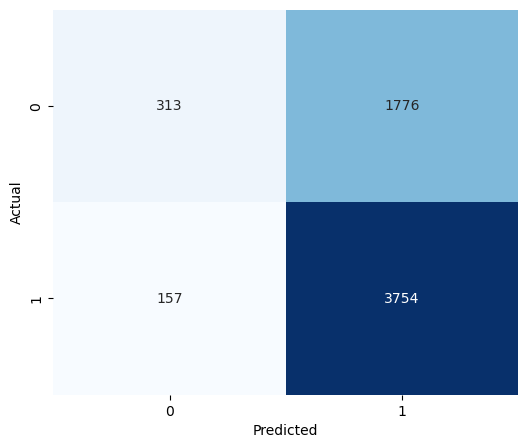

In [ ]:
plot_confusion_matrix(y_test,y_pred)

ROC-AUC Score for lr-model: 0.60


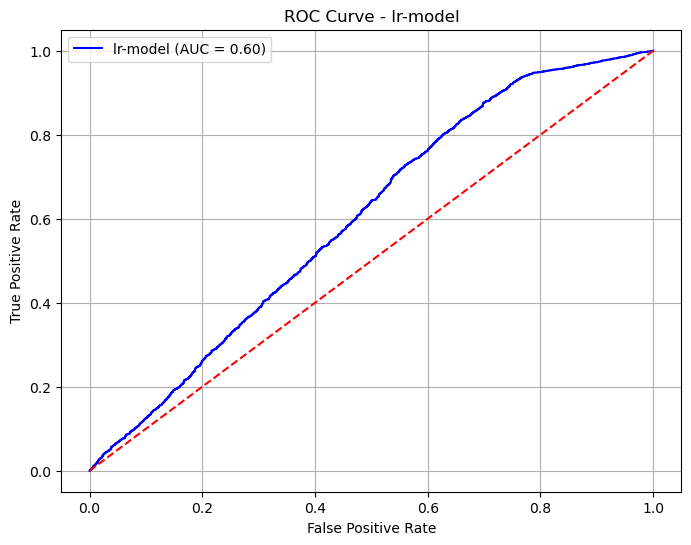

In [ ]:
plot_roc_curve(y_test,y_pred_proba,'lr-model')

In [ ]:
# model summary 
model_df("Logistic Regression ",y_test,y_pred)

,Model Name,Accuracy Score,Precision Score,Recall Score,F1 Score
0,Logistic Regression,67.783333,67.884268,95.985681,79.525474


#### Observation: not much impact is present after removing multicolineaority issue also. The model look almost the same

### Decision Tree

In [ ]:
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)
y_pred = dt_model.predict(X_test)
y_pred_prob = dt_model.predict_proba(X_test)[:, 1]

In [ ]:
metrics(y_test,y_pred,'Dt_model')

Dt_model
accuracy 0.566
precision 0.6736646292851448
recall 0.6481718230631552
fi score 0.6606724003127443
classification report               precision    recall  f1-score   support

           0       0.38      0.41      0.40      2089
           1       0.67      0.65      0.66      3911

    accuracy                           0.57      6000
   macro avg       0.53      0.53      0.53      6000
weighted avg       0.57      0.57      0.57      6000



<p>Observation : We get a <b>accuracy of 55%</b> and <b>precision and recall</b> seems to be <b>almost closer</b> to each other. </p>

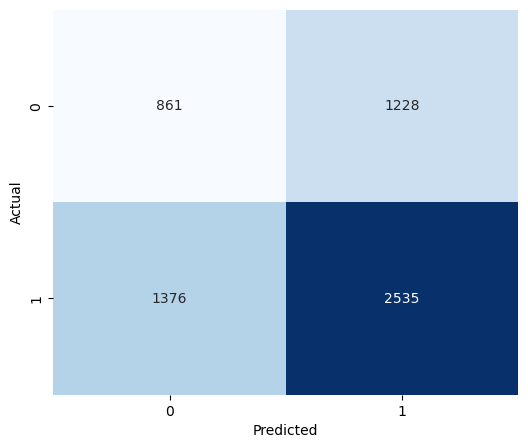

In [ ]:
plot_confusion_matrix(y_test,y_pred)

<p>Observation: Values of <b> Positive Class</b> is predicting more than <b> Negative class</b> values</p>

ROC-AUC Score for Decision Tree: 0.60


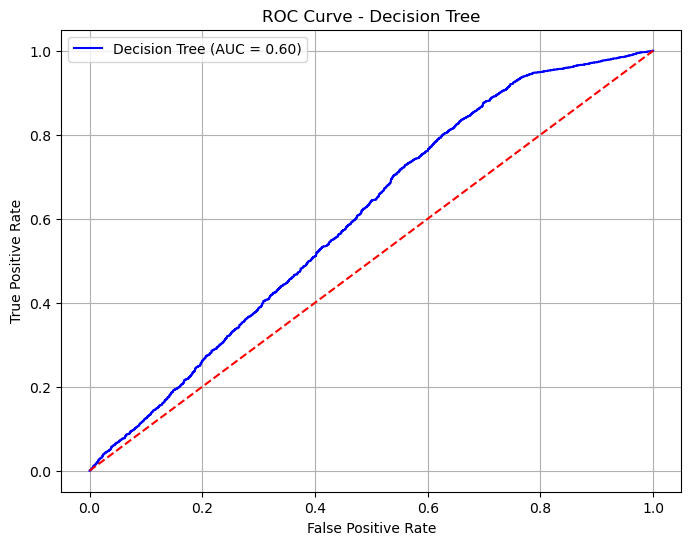

In [ ]:
# ROC curve 
plot_roc_curve(y_test,y_pred_proba,'Decision Tree')

In [ ]:
# check for under fit or over fit of model.
y_train_pred = lr_model.predict(X_train)
y_test_pred = lr_model.predict(X_test)

In [ ]:
train_df("Decision Tree Model",y_train,y_train_pred)

,Model Name,Accuracy Score,Precision Score,Recall Score,F1 Score
0,Logistic Regression Base model,68.335714,68.151930,96.537366,79.898427
0,Decision Tree Model,68.350000,68.187805,96.438746,79.889257


In [ ]:
test_df("Decision Tree Model",y_test,y_test_pred)

,Model Name,Accuracy Score,Precision Score,Recall Score,F1 Score
0,Logistic Regression Base model,67.700000,67.790803,96.113526,79.505076
0,Decision Tree Model,67.783333,67.884268,95.985681,79.525474


<p> Observation: The models looks showing <b>little of overfitting issue </b></p>

#### Tunned Dt

In [ ]:
param = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 10, 15, 20, None],
    'min_samples_split': [5, 10, 20, 50],
    'min_samples_leaf': [2, 4, 10]
}

In [ ]:
dt_serach=GridSearchCV(estimator=dt_model,param_grid=param,cv=5,n_jobs=-1,verbose=1)
model=dt_serach.fit(X_train,y_train)
print(model.best_params_)

<IPython.core.display.Javascript object>

Fitting 5 folds for each of 144 candidates, totalling 720 fits
{'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 5}


#### Rebuild model using tunned params

In [ ]:
dt_model = DecisionTreeClassifier(criterion=dt_serach.best_params_.get('criterion'),
                                  max_depth=dt_serach.best_params_.get('max_depth')
                                  ,min_samples_leaf=dt_serach.best_params_.get('min_samples_leaf')
                                  ,min_samples_split=dt_serach.best_params_.get('min_samples_split')
                                  ,random_state=42)
dt_model.fit(X_train, y_train)
y_pred = dt_model.predict(X_test)
y_pred_proba=dt_model.predict_proba(X_test)[:,1]

In [ ]:
metrics(y_test,y_pred,'Dt_model')

Dt_model
accuracy 0.6958333333333333
precision 0.6995790279372369
recall 0.9347992840705702
fi score 0.8002626682718617
classification report               precision    recall  f1-score   support

           0       0.67      0.25      0.36      2089
           1       0.70      0.93      0.80      3911

    accuracy                           0.70      6000
   macro avg       0.69      0.59      0.58      6000
weighted avg       0.69      0.70      0.65      6000



<p>Observation: Since the <b> recall value is 1</b>. Model looks like <b>more biased to positive class values only.</b></p>

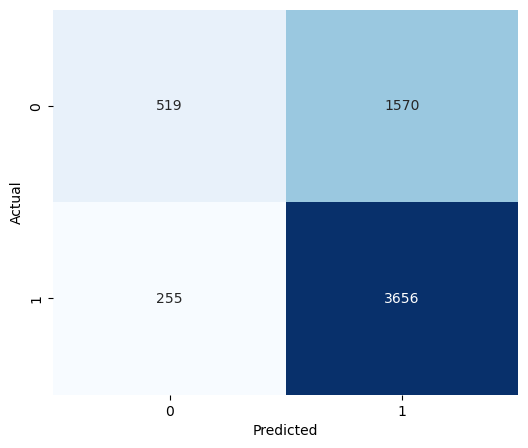

In [ ]:
plot_confusion_matrix(y_test,y_pred)

In [ ]:
# model summary 
model_df("Decision Tree",y_test,y_pred)

,Model Name,Accuracy Score,Precision Score,Recall Score,F1 Score
0,Logistic Regression,67.783333,67.884268,95.985681,79.525474
0,Decision Tree,69.583333,69.957903,93.479928,80.026267


<p>Observation: Model looks like <b>more biased to positive class values only.</b></p>

### Random forest

In [ ]:
rf = RandomForestClassifier(random_state=42)
rf_model = rf.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
y_pred_proba = rf_model.predict_proba(X_test)[:,1]
metrics(y_test, y_pred, 'Random Forest')


<IPython.core.display.Javascript object>

Random Forest
accuracy 0.6958333333333333
precision 0.6995790279372369
recall 0.9347992840705702
fi score 0.8002626682718617
classification report               precision    recall  f1-score   support

           0       0.67      0.25      0.36      2089
           1       0.70      0.93      0.80      3911

    accuracy                           0.70      6000
   macro avg       0.69      0.59      0.58      6000
weighted avg       0.69      0.70      0.65      6000



<p>Obbservation</p>

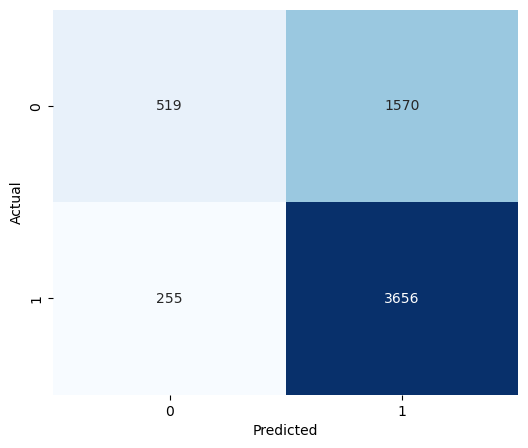

In [ ]:
plot_confusion_matrix(y_test,y_pred)

ROC-AUC Score for RandomForestClassifier(random_state=42): 0.59


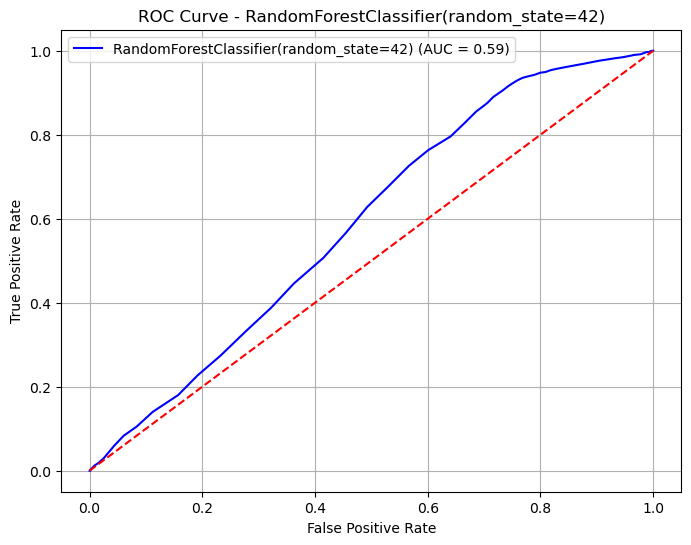

In [ ]:
# roc curve
plot_roc_curve(y_test,y_pred_proba,rf_model)

<p>Observation</p>

#### Tunning Random forest

In [ ]:

params = {
    'criterion': ['gini'],
    'n_estimators': [10, 50],
    'max_depth': [10],
    'max_features': ['sqrt'],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 5],
    'max_leaf_nodes': [None, 10]
}


In [ ]:
random_search = GridSearchCV(
    estimator=rf,
    param_grid=params,
    cv=5,
    verbose=1,
    n_jobs=-1
)
random_search.fit(X_train, y_train)
best_rf = random_search.best_estimator_
y_pred = best_rf.predict(X_test)
print("Best Params:", random_search.best_params_)

<IPython.core.display.Javascript object>

Fitting 5 folds for each of 16 candidates, totalling 80 fits
Best Params: {'criterion': 'gini', 'max_depth': 10, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 50}


<p>Observation</p>

In [ ]:
rf = RandomForestClassifier(criterion=random_search.best_params_.get('criterion')
                            ,n_estimators=random_search.best_params_.get('n_estimators'),
                            min_samples_split=random_search.best_params_.get('min_samples_split')
                            ,min_samples_leaf=random_search.best_params_.get('min_samples_leaf')
                            ,max_features=random_search.best_params_.get('max_feature')
                            ,max_depth=10,
                            random_state=42)
rf_model = rf.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)

metrics(y_test, y_pred_rf, 'Random Forest')

<IPython.core.display.Javascript object>

Random Forest
accuracy 0.6963333333333334
precision 0.6993701087993892
recall 0.9368447967271798
fi score 0.8008743169398908
classification report               precision    recall  f1-score   support

           0       0.68      0.25      0.36      2089
           1       0.70      0.94      0.80      3911

    accuracy                           0.70      6000
   macro avg       0.69      0.59      0.58      6000
weighted avg       0.69      0.70      0.65      6000



<p>Observation</p>

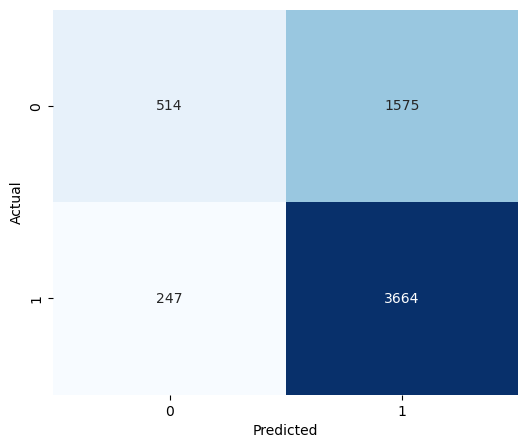

In [ ]:
plot_confusion_matrix(y_test,y_pred_rf)

In [ ]:
# 
model_df("Random Forest ",y_test,y_pred)

,Model Name,Accuracy Score,Precision Score,Recall Score,F1 Score
0,Logistic Regression,67.783333,67.884268,95.985681,79.525474
0,Decision Tree,69.583333,69.957903,93.479928,80.026267
0,Random Forest,69.233333,69.404247,94.425978,80.004333


<p>Observation</p>

### AdaBoost

In [ ]:
ada=AdaBoostClassifier(random_state=42)
ad_model=ada.fit(X_train,y_train)
train_pred = ad_model.predict(X_train)
y_pred=ad_model.predict(X_test)
y_pred_proba = ad_model.predict_proba(X_test)[:,1]

In [ ]:
# train 
metrics(y_train,train_pred,'ad_model')

ad_model
accuracy 0.6841428571428572
precision 0.681930693069307
recall 0.9660311198772737
fi score 0.7994921556180284
classification report               precision    recall  f1-score   support

           0       0.71      0.16      0.26      4874
           1       0.68      0.97      0.80      9126

    accuracy                           0.68     14000
   macro avg       0.70      0.56      0.53     14000
weighted avg       0.69      0.68      0.61     14000



In [ ]:
train_df("Ada Boost Model",y_train,train_pred)

,Model Name,Accuracy Score,Precision Score,Recall Score,F1 Score
0,Logistic Regression Base model,68.335714,68.151930,96.537366,79.898427
0,Decision Tree Model,68.350000,68.187805,96.438746,79.889257
0,Ada Boost Model,68.414286,68.193069,96.603112,79.949216


In [ ]:
metrics(y_test,y_pred,'ad_model')

ad_model
accuracy 0.6731666666666667
precision 0.6750448833034112
recall 0.9613909486064945
fi score 0.7931652779242696
classification report               precision    recall  f1-score   support

           0       0.65      0.13      0.22      2089
           1       0.68      0.96      0.79      3911

    accuracy                           0.67      6000
   macro avg       0.66      0.55      0.51      6000
weighted avg       0.67      0.67      0.59      6000



In [ ]:
# 
test_df("Ada Boost Model",y_test,y_pred)

,Model Name,Accuracy Score,Precision Score,Recall Score,F1 Score
0,Logistic Regression Base model,67.700000,67.790803,96.113526,79.505076
0,Decision Tree Model,67.783333,67.884268,95.985681,79.525474
0,Ada Boost Model,67.316667,67.504488,96.139095,79.316528


<p>Observation: There could be possibility of little overfitting issue in model</p>

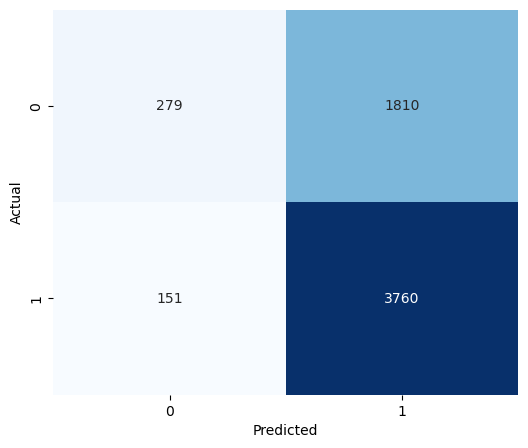

In [ ]:
plot_confusion_matrix(y_test,y_pred)

ROC-AUC Score for Ada Boost Model: 0.59


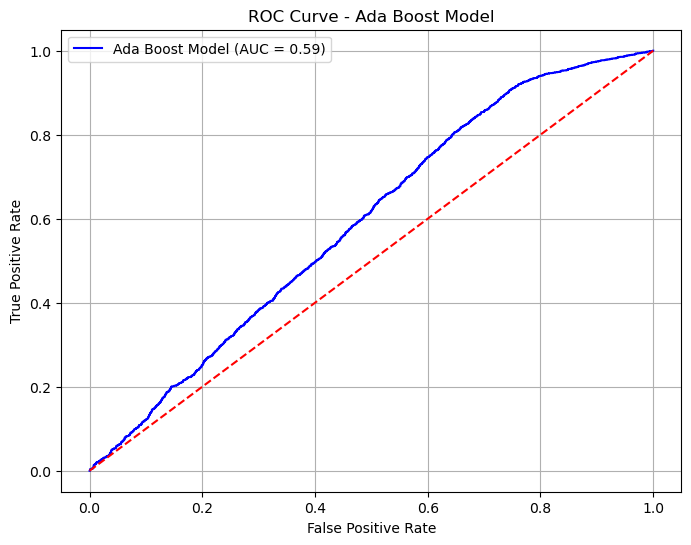

In [ ]:
# roc curve
plot_roc_curve(y_test,y_pred_proba,"Ada Boost Model")

<p>Observation</p>

In [ ]:
#tunning ada boost

In [ ]:
base_dt = DecisionTreeClassifier()
params = {
    'n_estimators': [50, 100, 150,200],
    'learning_rate': [0.01, 0.1, 0.5, 1.0],
    'algorithm': ['SAMME']
}

In [ ]:
ada = AdaBoostClassifier(estimator=base_dt)
grid = GridSearchCV(estimator=ada, param_grid=params, cv=5, scoring='accuracy', n_jobs=-1)
grid.fit(X_train, y_train)

print("Best Params:", grid.best_params_)
print("Best Score:", grid.best_score_)

<IPython.core.display.Javascript object>

Best Params: {'algorithm': 'SAMME', 'learning_rate': 0.01, 'n_estimators': 50}
Best Score: 0.565857142857143


#### Rebuild the model again use this params

In [ ]:
ada_model = AdaBoostClassifier(learning_rate = grid.best_params_.get('learning_rate')
                            ,n_estimators=grid.best_params_.get('n_estimators'),
                            algorithm = grid.best_params_.get('algorithm'),
                            random_state=42)
ada_model = ada_model.fit(X_train, y_train)
y_pred = ada_model.predict(X_test)

metrics(y_test, y_pred, 'Ada Boost Model')

Ada Boost Model
accuracy 0.6518333333333334
precision 0.6518333333333334
recall 1.0
fi score 0.7892240944405207
classification report               precision    recall  f1-score   support

           0       0.00      0.00      0.00      2089
           1       0.65      1.00      0.79      3911

    accuracy                           0.65      6000
   macro avg       0.33      0.50      0.39      6000
weighted avg       0.42      0.65      0.51      6000



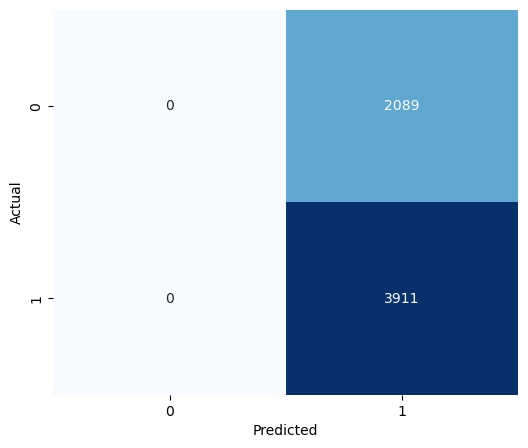

In [ ]:
# 
plot_confusion_matrix(y_test,y_pred)

ROC-AUC Score for Ada Boost Model: 0.59


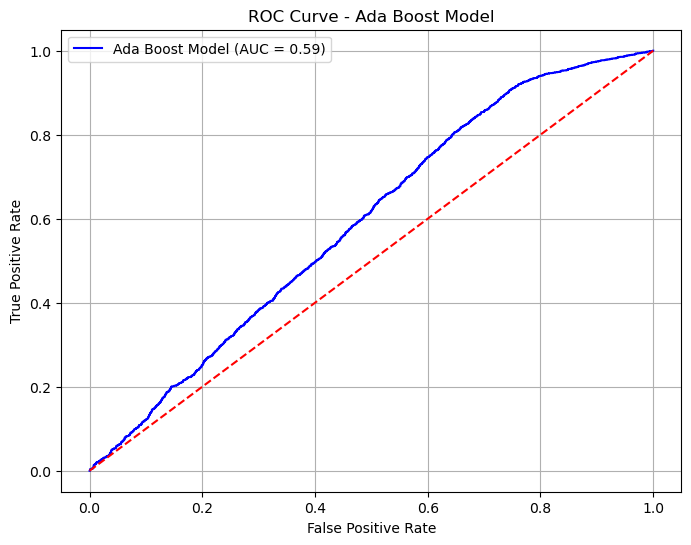

In [ ]:
# 
plot_roc_curve(y_test,y_pred_proba,"Ada Boost Model")

In [ ]:
# model 
model_df("Ada Boosting Model",y_test,y_pred)

,Model Name,Accuracy Score,Precision Score,Recall Score,F1 Score
0,Logistic Regression,67.783333,67.884268,95.985681,79.525474
0,Decision Tree,69.583333,69.957903,93.479928,80.026267
0,Random Forest,69.233333,69.404247,94.425978,80.004333
0,Ada Boosting Model,65.183333,65.183333,100.000000,78.922409


### Gradient Boost

In [ ]:
gb = GradientBoostingClassifier()
gb.fit(X_train, y_train)
y_pred = gb.predict(X_test)
train_pred = gb.predict(X_train)
y_pred_proba = gb.predict_proba(X_test)[:1]

In [ ]:
# train metrics 
metrics(y_train,train_pred,"GB Model")

GB Model
accuracy 0.7001428571428572
precision 0.7016696677033885
recall 0.9394039009423625
fi score 0.8033170914542729
classification report               precision    recall  f1-score   support

           0       0.69      0.25      0.37      4874
           1       0.70      0.94      0.80      9126

    accuracy                           0.70     14000
   macro avg       0.70      0.60      0.59     14000
weighted avg       0.70      0.70      0.65     14000



In [ ]:
# 
train_df("GB Model",y_train,train_pred)

,Model Name,Accuracy Score,Precision Score,Recall Score,F1 Score
0,Logistic Regression Base model,68.335714,68.151930,96.537366,79.898427
0,Decision Tree Model,68.350000,68.187805,96.438746,79.889257
0,Ada Boost Model,68.414286,68.193069,96.603112,79.949216
0,GB Model,70.014286,70.166967,93.940390,80.331709


In [ ]:
metrics(y_test,y_pred,'GB_model')

GB_model
accuracy 0.696
precision 0.699331423113658
recall 0.9360777294809511
fi score 0.8005685545593703
classification report               precision    recall  f1-score   support

           0       0.67      0.25      0.36      2089
           1       0.70      0.94      0.80      3911

    accuracy                           0.70      6000
   macro avg       0.69      0.59      0.58      6000
weighted avg       0.69      0.70      0.65      6000



In [ ]:
# test model
test_df("GB model",y_test,y_pred)

,Model Name,Accuracy Score,Precision Score,Recall Score,F1 Score
0,Logistic Regression Base model,67.700000,67.790803,96.113526,79.505076
0,Decision Tree Model,67.783333,67.884268,95.985681,79.525474
0,Ada Boost Model,67.316667,67.504488,96.139095,79.316528
0,GB model,69.600000,69.933142,93.607773,80.056855


<p>Observation: There is scope for little overfitting in model</p>

In [ ]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'max_features': ['sqrt', 'log2']
}

grid = GridSearchCV(estimator=gb, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid.fit(X_train, y_train)

print("Best Parameters:", grid.best_params_)
print("Best Score:", grid.best_score_)

<IPython.core.display.Javascript object>

Best Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'max_features': 'sqrt', 'n_estimators': 300, 'subsample': 1.0}
Best Score: 0.696


#### Rebuild the model

In [155]:
gb = GradientBoostingClassifier(learning_rate=grid.best_params_.get('learning_rate')
                                ,max_depth=grid.best_params_.get('max_depth'),
                                max_features=grid.best_params_.get('max_features'),
                                n_estimators=grid.best_params_.get('n_estimators'),
                                subsample=1.0,random_state=42)
gb.fit(X_train, y_train)
y_pred = gb.predict(X_test)
y_pred_proba = gb.predict_proba(X_test)[:1]

In [156]:
metrics(y_test,y_pred,'GB-tunned')

GB-tunned
accuracy 0.6958333333333333
precision 0.6982136069935386
recall 0.9394016875479417
fi score 0.8010465496566009
classification report               precision    recall  f1-score   support

           0       0.68      0.24      0.35      2089
           1       0.70      0.94      0.80      3911

    accuracy                           0.70      6000
   macro avg       0.69      0.59      0.58      6000
weighted avg       0.69      0.70      0.65      6000



<p>Observation: Accuracy remains same</p>

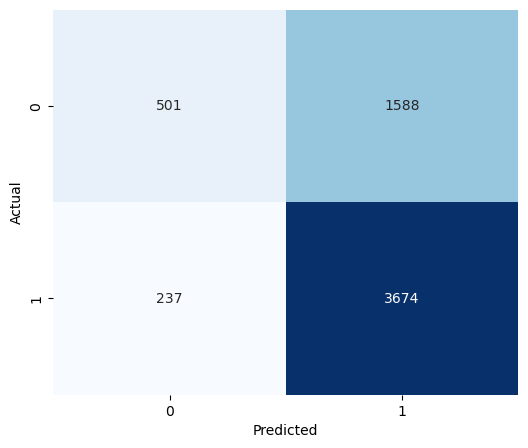

In [157]:
plot_confusion_matrix(y_test,y_pred)

In [ ]:
# 
model_df("Gradient Boosting Model",y_test,y_pred)

,Model Name,Accuracy Score,Precision Score,Recall Score,F1 Score
0,Logistic Regression Model,67.700000,67.790803,96.113526,79.505076
0,Logistic Regression After removing Multicoline...,67.783333,67.884268,95.985681,79.525474
0,Decision Tree Model,56.600000,67.366463,64.817182,66.067240
0,Decision Tree After tunning,69.583333,69.957903,93.479928,80.026267
0,Random Forest,69.583333,69.957903,93.479928,80.026267
0,Random Forest,69.233333,69.404247,94.425978,80.004333
0,Ada Boosting Model,67.483333,67.481270,96.727180,79.499842
0,Gradient Boosting Model,69.583333,69.821361,93.940169,80.104655


<p>Observation</p>

### XGBOOST

In [162]:
XGB = XGBClassifier()
xgb_model=XGB.fit(X_train, y_train)
train_pred = xgb_model.predict(X_train)
y_pred = xgb_model.predict(X_test)

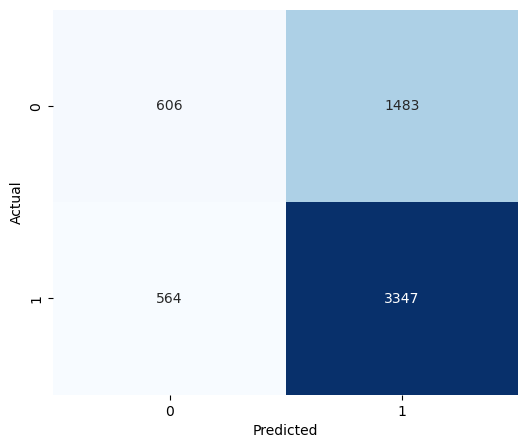

In [164]:
# 
plot_confusion_matrix(y_test,y_pred)

In [ ]:
metrics(y_train,train_pred,"XG-model")

XG-model
accuracy 0.7001428571428572
precision 0.7016696677033885
recall 0.9394039009423625
fi score 0.8033170914542729
classification report               precision    recall  f1-score   support

           0       0.69      0.25      0.37      4874
           1       0.70      0.94      0.80      9126

    accuracy                           0.70     14000
   macro avg       0.70      0.60      0.59     14000
weighted avg       0.70      0.70      0.65     14000



In [ ]:
#
train_df("XGB Boosting",y_train,train_pred)

,Model Name,Accuracy Score,Precision Score,Recall Score,F1 Score
0,Logistic Regression Base model,68.335714,68.151930,96.537366,79.898427
0,Decision Tree Model,68.350000,68.187805,96.438746,79.889257
0,Ada Boost Model,68.414286,68.193069,96.603112,79.949216
0,Ada Boost Model,68.414286,68.193069,96.603112,79.949216
0,GB Model,70.014286,70.166967,93.940390,80.331709
0,XGB Boosting,70.014286,70.166967,93.940390,80.331709


In [ ]:
metrics(y_test,y_pred,'XG-model')

XG-model
accuracy 0.6588333333333334
precision 0.69296066252588
recall 0.8557913577090258
fi score 0.7658162681615376
classification report               precision    recall  f1-score   support

           0       0.52      0.29      0.37      2089
           1       0.69      0.86      0.77      3911

    accuracy                           0.66      6000
   macro avg       0.61      0.57      0.57      6000
weighted avg       0.63      0.66      0.63      6000



In [ ]:
#
test_df("XGB Boosting",y_test,y_pred)

,Model Name,Accuracy Score,Precision Score,Recall Score,F1 Score
0,Logistic Regression Base model,67.700000,67.790803,96.113526,79.505076
0,Decision Tree Model,67.783333,67.884268,95.985681,79.525474
0,Ada Boost Model,67.316667,67.504488,96.139095,79.316528
0,Ada Boost Model,67.316667,67.504488,96.139095,79.316528
0,GB model,69.600000,69.933142,93.607773,80.056855
0,XGB Boosting,65.883333,69.296066,85.579136,76.581627


<p>Observation: Show chances for overfitting</p>

In [ ]:
# tunning 
param = {
    'n_estimators': [100, 200, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5, 6],
    'min_child_weight': [1, 3, 5],
    'gamma': [0, 0.1, 0.5],
    'scale_pos_weight': [1, 2, 5] 
}

In [ ]:
grid_search = GridSearchCV(
    estimator=XGB,
    param_grid=param,
    scoring='recall',
    cv=5,
    verbose=2,
    n_jobs=-1
)

grid_search.fit(X_train, y_train)
print("Best Parameters:", grid_search.best_params_)

<IPython.core.display.Javascript object>

Fitting 5 folds for each of 1296 candidates, totalling 6480 fits
Best Parameters: {'gamma': 0, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'scale_pos_weight': 2}


In [ ]:
XGB = XGBClassifier(learning_rate= grid_search.best_params_.get('learning_rate')
                    ,max_depth= grid_search.best_params_.get('max_depth')
                    ,min_child_weight=grid_search.best_params_.get('min_child')
                    ,n_estimators=grid_search.best_params_.get('n_estimators')
                    ,scale_pos_weight=grid_search.best_params_.get('scale_pos_weight')
                    )
xgb_model=XGB.fit(X_train, y_train)
y_pred = xgb_model.predict(X_test)
y_pred_proba=xgb_model.predict_proba(X_test)[:,1]
y_pred=(y_pred_prob>=0.7).astype(int)

In [ ]:
metrics(y_test,y_pred,"XGB Boosting")

XGB Boosting
accuracy 0.6968333333333333
precision 0.699847153228888
recall 0.9365891076451035
fi score 0.8010934937124111
classification report               precision    recall  f1-score   support

           0       0.68      0.25      0.36      2089
           1       0.70      0.94      0.80      3911

    accuracy                           0.70      6000
   macro avg       0.69      0.59      0.58      6000
weighted avg       0.69      0.70      0.65      6000



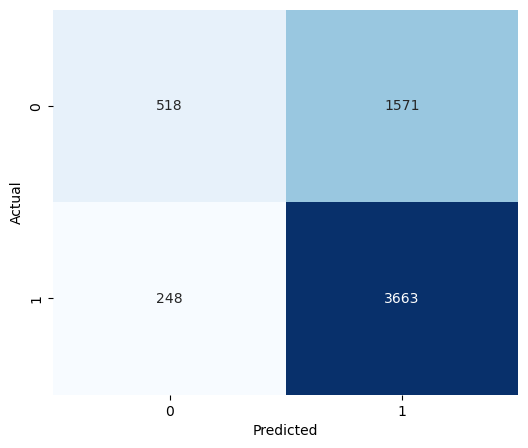

In [ ]:
plot_confusion_matrix(y_test,y_pred)

ROC-AUC Score for XGB_model: 0.59


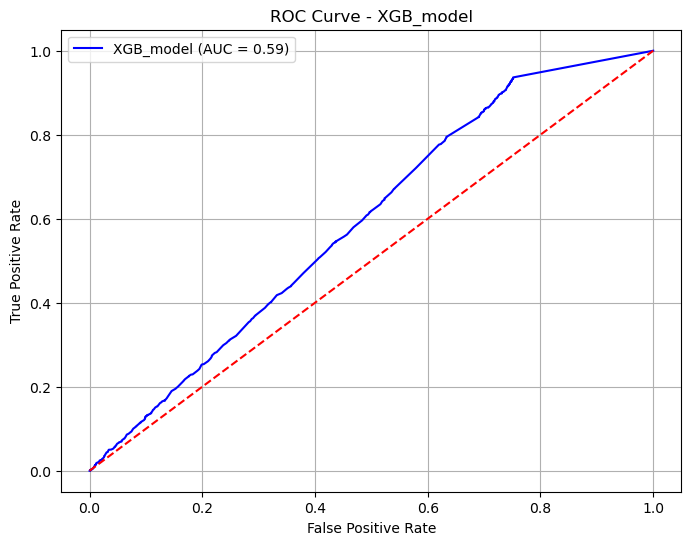

In [ ]:
# 
plot_roc_curve(y_test,y_pred_proba,"XGB_model")

In [ ]:
# model_summary
model_df("XGB Boosting",y_test,y_pred)

,Model Name,Accuracy Score,Precision Score,Recall Score,F1 Score
0,Logistic Regression Model,67.700000,67.790803,96.113526,79.505076
0,Logistic Regression After removing Multicoline...,67.783333,67.884268,95.985681,79.525474
0,Decision Tree Model,56.600000,67.366463,64.817182,66.067240
0,Decision Tree After tunning,69.583333,69.957903,93.479928,80.026267
0,Random Forest,69.583333,69.957903,93.479928,80.026267
0,Random Forest,69.233333,69.404247,94.425978,80.004333
0,Ada Boosting Model,67.483333,67.481270,96.727180,79.499842
0,Gradient Boosting Model,69.583333,69.821361,93.940169,80.104655
0,XGB Boosting,65.183333,65.183333,100.000000,78.922409


<p>Observation</p>

### Support Vector Machines (SVM)

In [159]:
svm = SVC()
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
train_pred = svm.predict(X_train)
#y_pred_proba = svm.predict_proba(X_test)[:1]

In [160]:
metrics(y_test,y_pred,'SVM_model')

SVM_model
accuracy 0.6518333333333334
precision 0.6518333333333334
recall 1.0
fi score 0.7892240944405207
classification report               precision    recall  f1-score   support

           0       0.00      0.00      0.00      2089
           1       0.65      1.00      0.79      3911

    accuracy                           0.65      6000
   macro avg       0.33      0.50      0.39      6000
weighted avg       0.42      0.65      0.51      6000



In [161]:
# Tunning
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}

grid = GridSearchCV(svm, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid.fit(X_train, y_train)

<IPython.core.display.Javascript object>

KeyboardInterrupt: 

In [ ]:
svm = SVC(C=1,gamma='scale',kernel='rbf')
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)

<p>Obserevation</p>

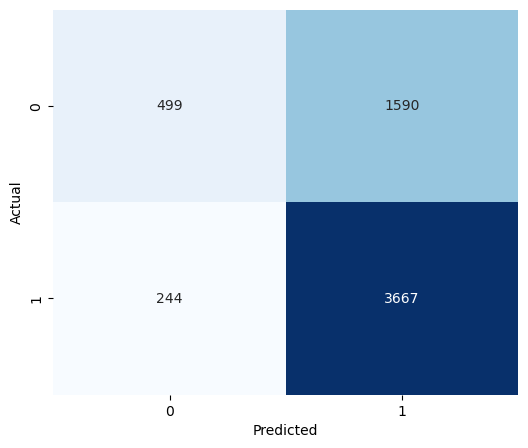

In [ ]:
plot_confusion_matrix(y_test,y_pred)

<p>Observation</p>

In [ ]:
metrics(y_test,y_pred,'tunned_svm')

tunned_svm
accuracy 0.6966666666666667
precision 0.6992567181246426
recall 0.9381232421375607
fi score 0.8012666521074471
classification report               precision    recall  f1-score   support

           0       0.68      0.24      0.36      2089
           1       0.70      0.94      0.80      3911

    accuracy                           0.70      6000
   macro avg       0.69      0.59      0.58      6000
weighted avg       0.69      0.70      0.65      6000



<p>Observati0on</p>

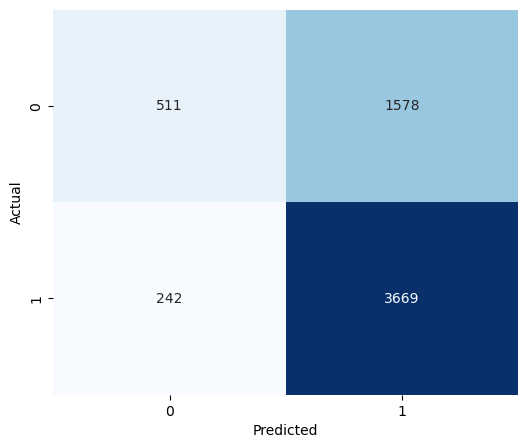

In [ ]:
plot_confusion_matrix(y_test,y_pred)

In [ ]:
# 
model_df("SVC Model",y_test,y_pred)

<p>Observation</p>

### Light GBM

In [ ]:
model = LGBMClassifier()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 9126, number of negative: 4874
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 659
[LightGBM] [Info] Number of data points in the train set: 14000, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.651857 -> initscore=0.627213
[LightGBM] [Info] Start training from score 0.627213


In [ ]:
metrics(y_test,y_pred,'LGBM')

LGBM
accuracy 0.6945
precision 0.6987375669472073
recall 0.9340322168243416
fi score 0.7994310099573257
classification report               precision    recall  f1-score   support

           0       0.67      0.25      0.36      2089
           1       0.70      0.93      0.80      3911

    accuracy                           0.69      6000
   macro avg       0.68      0.59      0.58      6000
weighted avg       0.69      0.69      0.65      6000



<p>Observation</p>

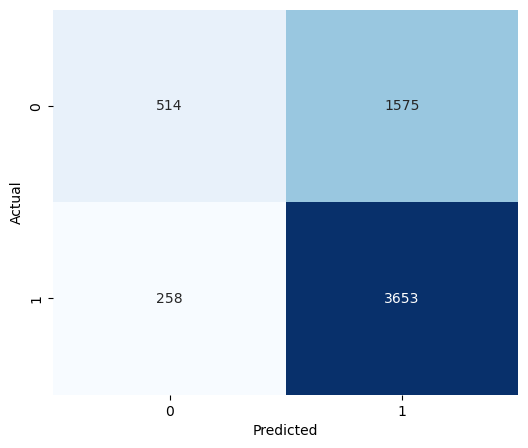

In [ ]:
plot_confusion_matrix(y_test,y_pred)

<p>Observation</p>

In [ ]:
#tunning

In [ ]:
param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [5, 10, -1],
    'num_leaves': [31, 64],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid.fit(X_train, y_train)

print("Best Parameters:", grid.best_params_)
print("Best Score:", grid.best_score_)

<IPython.core.display.Javascript object>

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 9126, number of negative: 4874
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 659
[LightGBM] [Info] Number of data points in the train set: 14000, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.651857 -> initscore=0.627213
[LightGBM] [Info] Start training from score 0.627213
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

### shap values

<IPython.core.display.Javascript object>

 97%|=================== | 5849/6000 [00:32<00:00]       

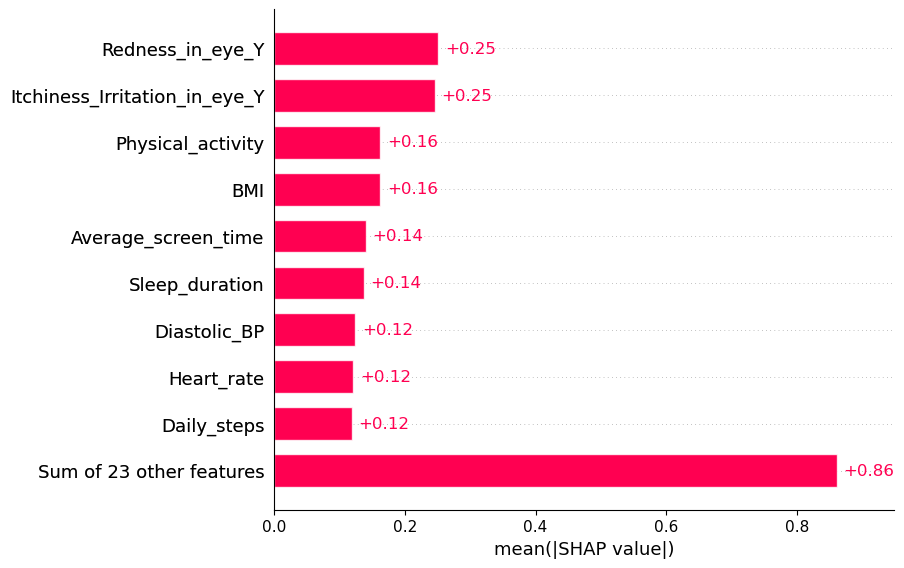

In [ ]:
import shap
model = xgb.XGBClassifier(eval_metric='logloss', use_label_encoder=False)
model.fit(X_train, y_train)

# SHAP Explainer
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Summary Plot (bar shows global feature importance)
shap.plots.bar(shap_values, max_display=10)

### Voting Classifier

In [ ]:

from sklearn.ensemble import VotingClassifier
voting_clf = VotingClassifier(estimators=[
    ('dt', dt_model),
    ('rf', rf),
    ('ada', ada),
    ('gb',gb),
    ('xgb', XGB),
    ('lbgm',lgbm),
], voting='soft')  # Use 'hard' for majority vote, 'soft' for probabilities

# Fit VotingClassifier
voting_clf.fit(X_train, y_train)

Voting Classifier Accuracy: 0.6416666666666667


In [ ]:
models = [
    ('Logistic Regression', lr_model),
    ('Decision Tree', dt_model),
    ('Random Forest', rf),
    ('Gradient Boosting', gb),
    ('XGBoost', XGB),
    ('LightGBM', lgbm),
    ('AdaBoost', ada),
    ('SVC', svm),
    ('Voting Classifier', voting_clf)
]
results = []

# Loop through models
for name, model in models:
    y_pred = model.predict(X_test)
    acc, prec, rec, f1 = metric(y_test, y_pred, name)
    
    results.append({
        'Model': name,
        'Accuracy': acc,
        'Precision': prec,
        'Recall': rec,
        'F1-Score': f1
    })

# Convert results to DataFrame
df_results = pd.DataFrame(results)
df_results

In [ ]:
# RFE 
# Models
models = [dt_model,rf, ada, gb, XGB, lgbm, svm]  # your pre-trained models
model_names = ['decision tree', 'random forest', 'Ada Boost', 'GradientBoost', 'XGBoost', 'Light GBM', 'Support Vector']


# Number of features to select
n_features_to_select = 30
for model, name in zip(models, model_names):
    # RFE Feature Selection
    rfe = RFE(estimator=model, n_features_to_select=n_features_to_select)
    rfe.fit(X_train, y_train)
    selected_features = X_train.columns[rfe.support_]
    print(f'{name}\n',selected_features)